In [27]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import sklearn
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score

# o	
- Will a different set of predictors (feature engineering) give us better predictions of land values in Massachusetts?(Choose some and say why) (Lab 3)-> continue on to using neural netowrk. sci-kit learn. Aim is to build a classification model to predict land values in MA. And then perform matching??? 

  
-	Cross-validation
o	Which modeling strategy most accurately predicts land values in a larger region it hasn’t seen yet (i.e., spatial cross-validation instead of random cross-validation)? (Lab 3)

In [28]:
#working folder to Lab3 
def wf(x):
    return '/Users/cecilywang/Downloads/EE508/Data/Lab3/' + x

In [29]:
#importing pc_MA_EE508.shp as a geodataframe to shp and setting index = 'pid'
shp = gpd.read_file(wf('pc_MA_EE508.shp'))
shp = shp.set_index('pid')

In [30]:
shp

,geometry
pid,
M_252104_934240,"POLYGON ((252253.238 934287.036, 252240.074 93..."
F_803174_3027860,"POLYGON ((244848.861 922901.341, 244830.509 92..."
M_238118_942044,"POLYGON ((238169.901 942152.056, 238201.019 94..."
F_736007_3068967,"POLYGON ((224650.310 935515.699, 224649.878 93..."
M_240445_943056,"POLYGON ((240322.960 942971.725, 240310.209 94..."
...,...
M_67459_886161,"POLYGON ((68137.926 885776.905, 68076.906 8857..."
F_172467_2984485,"POLYGON ((53119.157 910368.374, 53143.475 9102..."
M_66650_919364,"POLYGON ((67462.518 920760.161, 67364.885 9203..."


In [31]:
#•	Import pc_MA_EE508.csv as a DataFrame to the variable d and setting index = 'pid'
d = pd.read_csv(wf('pc_MA_EE508.csv'), encoding = 'utf-8')
d = d.set_index('pid')
d

/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_21353/3583611997.py:2: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  d = pd.read_csv(wf('pc_MA_EE508.csv'), encoding = 'utf-8')


,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,p_pasture,p_crops,p_wetland_w,p_wetland_e,pop_dens_bg_2012-2016,pop_dens_tract_2012-2016,hh_inc_med_bg_2012-2016,hh_inc_med_tract_2012-2016,hh_inc_avg_bg_2012-2016,hh_inc_avg_tract_2012-2016
pid,,,,,,,,,,,,,,,,,,,,,
M_252104_934240,25009,27900,4.633,2.676,19.000,16.0,0.000,211.2,0.0,0.000,...,0.0,0.0,42.0,0.0,90.835110,187.169306,93694.0,85952.0,119735.951662,100460.592460
F_803174_3027860,25009,16250,1.138,3.269,8.000,0.0,0.000,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,475.463703,527.576691,71167.0,98264.0,107637.264151,111868.256722
M_238118_942044,25009,27620,3.052,6.315,14.000,10.0,0.000,0.0,0.0,0.000,...,6.0,0.0,0.0,0.0,184.101299,274.508363,94929.0,96512.0,127585.099685,115417.941953
F_736007_3068967,25009,1465,10.282,2.205,5.667,5.0,0.583,0.0,0.0,0.000,...,0.0,0.0,7.0,1.0,155.803790,247.731734,114083.0,154922.0,184615.587530,182983.421159
M_240445_943056,25009,27620,2.165,2.538,20.000,48.0,0.000,0.0,0.0,0.000,...,0.0,0.0,50.0,0.0,184.101299,274.508363,94929.0,96512.0,127585.099685,115417.941953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_67459_886161,25003,51580,109.997,4.771,71.333,34.0,0.000,0.0,1640.0,1523.297,...,2.0,0.0,18.0,1.0,15.489463,10.372609,74583.0,69306.0,90927.272727,84795.126706
F_172467_2984485,25003,53960,115.045,2.960,46.857,40.0,0.000,0.0,604.4,390.769,...,2.0,5.0,10.0,6.0,52.586639,181.477845,78083.0,80388.0,88131.578947,94874.911482
M_66650_919364,25003,16180,164.331,7.350,98.125,2.0,0.000,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,41.535155,117.970724,70982.0,55774.0,90679.292035,74035.661113


In [32]:
#•	Import MA_outline.shp as a GeoDataFrame to the variable shp_ma_outline.
shp_ma_outline = gpd.read_file(wf('MA_outline.shp'))
shp_ma_outline

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,25,001,00606927,25001,Barnstable,Barnstable County,06,H1,G4020,148,12700,NaN,A,1020989893,-1934621232,+41.7990145,-070.2118803,"MULTIPOLYGON (((281070.140 813463.319, 281070...."


In [33]:
#copy of shp 
shp_c = shp.copy()
#Set its geometry to the centroid of the polygons:
shp_c['geometry'] = shp_c['geometry'].centroid 
shp_c

,geometry
pid,
M_252104_934240,POINT (252103.857 934239.867)
F_803174_3027860,POINT (244807.918 922893.447)
M_238118_942044,POINT (238099.159 942052.146)
F_736007_3068967,POINT (224335.533 935423.153)
M_240445_943056,POINT (240370.270 943069.127)
...,...
M_67459_886161,POINT (67459.168 886160.576)
F_172467_2984485,POINT (52631.496 909861.539)
M_66650_919364,POINT (66935.136 919572.579)


### Below is an example of plotting ONE variable: 'travel' in MA

- Joining shp_c with d "on the fly" (i.e., right before plotting) allows you to always use the most recent data in d. 
- This will be useful later when we plot and compare model results.
- You can scale the point size in proportion to the size of the parcels by calling plot with a markersize argument that receives either (i) a column name from the GeoDataFrame (e.g., markersize='ha') 


#### As we are about do plot a lot of maps of Massachusetts parcels, it will be useful to create an additional column that stores the markersize for each parcel (so you can pass markersize='ms' as an argument to plot()).

In [34]:

shp_c['ms'] = d['ha'] / 10


In [35]:
shp_c.join(d['travel'])

,geometry,ms,travel
pid,,,
M_252104_934240,POINT (252103.857 934239.867),0.4633,19.000
F_803174_3027860,POINT (244807.918 922893.447),0.1138,8.000
M_238118_942044,POINT (238099.159 942052.146),0.3052,14.000
F_736007_3068967,POINT (224335.533 935423.153),1.0282,5.667
M_240445_943056,POINT (240370.270 943069.127),0.2165,20.000
...,...,...,...
M_67459_886161,POINT (67459.168 886160.576),10.9997,71.333
F_172467_2984485,POINT (52631.496 909861.539),11.5045,46.857
M_66650_919364,POINT (66935.136 919572.579),16.4331,98.125


In [36]:
shp_c = shp_c.join(d)
shp_c

,geometry,ms,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,...,p_pasture,p_crops,p_wetland_w,p_wetland_e,pop_dens_bg_2012-2016,pop_dens_tract_2012-2016,hh_inc_med_bg_2012-2016,hh_inc_med_tract_2012-2016,hh_inc_avg_bg_2012-2016,hh_inc_avg_tract_2012-2016
pid,,,,,,,,,,,,,,,,,,,,,
M_252104_934240,POINT (252103.857 934239.867),0.4633,25009,27900,4.633,2.676,19.000,16.0,0.000,211.2,...,0.0,0.0,42.0,0.0,90.835110,187.169306,93694.0,85952.0,119735.951662,100460.592460
F_803174_3027860,POINT (244807.918 922893.447),0.1138,25009,16250,1.138,3.269,8.000,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,475.463703,527.576691,71167.0,98264.0,107637.264151,111868.256722
M_238118_942044,POINT (238099.159 942052.146),0.3052,25009,27620,3.052,6.315,14.000,10.0,0.000,0.0,...,6.0,0.0,0.0,0.0,184.101299,274.508363,94929.0,96512.0,127585.099685,115417.941953
F_736007_3068967,POINT (224335.533 935423.153),1.0282,25009,1465,10.282,2.205,5.667,5.0,0.583,0.0,...,0.0,0.0,7.0,1.0,155.803790,247.731734,114083.0,154922.0,184615.587530,182983.421159
M_240445_943056,POINT (240370.270 943069.127),0.2165,25009,27620,2.165,2.538,20.000,48.0,0.000,0.0,...,0.0,0.0,50.0,0.0,184.101299,274.508363,94929.0,96512.0,127585.099685,115417.941953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_67459_886161,POINT (67459.168 886160.576),10.9997,25003,51580,109.997,4.771,71.333,34.0,0.000,0.0,...,2.0,0.0,18.0,1.0,15.489463,10.372609,74583.0,69306.0,90927.272727,84795.126706
F_172467_2984485,POINT (52631.496 909861.539),11.5045,25003,53960,115.045,2.960,46.857,40.0,0.000,0.0,...,2.0,5.0,10.0,6.0,52.586639,181.477845,78083.0,80388.0,88131.578947,94874.911482
M_66650_919364,POINT (66935.136 919572.579),16.4331,25003,16180,164.331,7.350,98.125,2.0,0.000,0.0,...,0.0,0.0,0.0,0.0,41.535155,117.970724,70982.0,55774.0,90679.292035,74035.661113


-	Pass the argument alpha=0.5 to the plot function to reduce the opacity of the points to 50%. This will make the points partially transparent. This is useful if you have overlapping points and wish to see all of them.
-	If your plot does not show much color heterogeneity, recall that you can use the scheme argument to use a different classification system (e.g. scheme='quantiles').


/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


<Axes: >

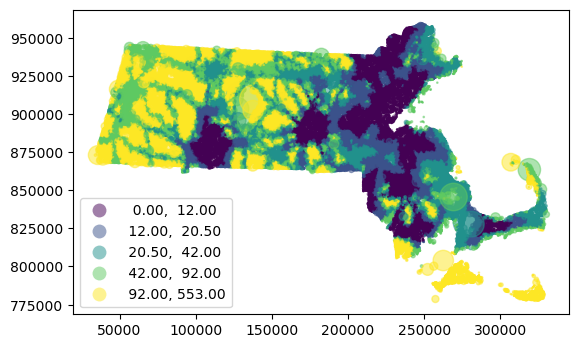

In [285]:
shp_c.join(d['travel']).plot(
    column='travel',
    markersize='ms',
    alpha=0.5,
    scheme='quantiles',
    legend=True,
)

# Pre computing variables

- The outcome variable for our deforestation risk estimation will be the change in the percentage of parcel-level forest cover between 1990 and 2010:

In [37]:
#deforestation risk estimation
d['p_f_change'] = d['p_f_2010'] - d['p_f_1990']


- The outcome variable for our cost estimation will be the log of the per-hectare sale price of the last sale of the property ('ls_price').
Using logged prices in property value prediction is very common, because the distribution of these prices is usually highly skewed 
(similar to income distributions), and taking the logarithm allows us to 

In [38]:
#cost estimation
d['ls_price_per_ha_log'] = np.log(d['ls_price'] / d['ha'])

- We will need the year of the last sale in order to identify recent sales and to include the year as an independent variable. The following code transforms a Series with dates in string format to a date format, and then uses the dt (short for date) accessor to obtain its year:
r


In [39]:
#year of last sale
d['ls_year'] = pd.to_datetime(d['ls_date']).dt.year

- We also need to drop properties that had an easement when they sold, because we want our estimates to reflect the full value of an unencumbered property. We can achieve this by creating a new variable that gives us the percentage of easement ('p_e') on a property at the time of its last sale (ls). This also means that we assume that, before the year of the easement creation ('e_year'), there was no easement on the property:)


In [40]:
#deciding to drop easements
d['p_e_ls'] = np.where(d['e_year'] <= d['ls_year'], d['p_e'], 0)

# year of easement creation = 'e_year'
# percentage of easement = 'p_e'
# last sale of property = 'ls'

-	Note the use of np.where(condition, x, y), which is similar to ifelse in R. For each element, if condition is True, it returns the value of x (or the corresponding element in x, if x is a Series), otherwise it returns the value of y (or its corresponding element in y).

In [41]:
# normalize the building area to the parcel size (akin to building density).
d['bld_area_per_ha'] = d['bld_area'] / d['ha']


### The next step is to build a suite of datasets that only contain the data that we'll use in the statistical estimation (dropping everything else). 
### We need one dataset to predict last sale prices (for which we will use the suffix _ls) and another one to estimate the probability of forest change (for which we will use the suffix _fc). 
### For each dataset, we will need 1) a DataFrame X (uppercase by convention) that contains all predictor variables (X_ls or X_fc) and 2) a Series y (lowercase by convention) that contains the independent variable (y_ls and y_fc, respectively).

- We will use different sets of predictor variables for the sale price and the forest change model. This is for three reasons:
  
1. We will use two different time periods for each predictive model. Forest change is a phenomenon that happens rarely, so we choose as long as a time period as possible (20 years) to get a sense of patterns. However, last sales data is better for recent time periods and errors increase as you go back in time; we will therefore use sales data starting in 2000. To the extent possible, the predictor variable will have to be from the beginning of the respective time period.
2.	We will use year-2011 land cover classes and recent building data in the sales price model, as they provide a proxy for land use (agricultural, forest, development, etc.), but we won't use them in the forest change model, as this could confounding the outcome prediction (i.e. we'd risk predicting 1990-2010 forest change by its 2011 outcome).
3.	The year of sale is only relevant in the land price model. 


In [291]:
#In line with the official Python style (see PEP8 style guide), we will use uppercase letters to define constants that won't change:

# constants for the dataset to predict last sale prices (_ls)
XCOLS_LS = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage', 
            'lake_frontage', 'pop_dens_tract_2012-2016', 
            'hh_inc_avg_tract_2012-2016',
            'p_f_2000', 'p_prot_2000_500', 
            'p_d_2000_200', 'p_d_2000_1000', 'p_d_2000_5000',
            'p_dev_open', 'p_dev_low', 'p_dev_medium', 'p_dev_high', 
            'p_crops', 'p_pasture','p_grassland', 'bld_area_per_ha', 
            'ls_year']

#constants for the dataset to estimate the probability of forest change(_fc)
XCOLS_FC = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage', 
            'lake_frontage',  'pop_dens_tract_2012-2016', 
            'hh_inc_avg_tract_2012-2016', 
            'p_f_1990', 'p_prot_1990_500', 
            'p_d_1990_200', 'p_d_1990_1000', 'p_d_1990_5000']


•	The sale price prediction dataset should only contain parcels
1) that have no missing values in the predictors (XCOLS_LS) and outcomes,
2) that were sold between 2000 and 2019 (inclusive of both years), and
3) that were not protected by an easement at the time they were sold.
4)
  Go ahead and identify those rows. There should be 44,424 of them. Once you have identified them, use d.loc[..., ...].copy() to create X_ls and y_ls

In [292]:
#Sale prediction dataset validation: 

# no missing values in the predictors and outcomes
i_ls = d[XCOLS_LS].isnull().sum(1).eq(0)
#sold between [2000-2019]
i_ls &= d['ls_year'].ge(2000)
i_ls &= d['ls_year'].le(2019)
#not protected by an easement at time sold
i_ls &= d['p_e_ls'].eq(0)

X_ls = d.loc[i_ls, XCOLS_LS].copy()
y_ls = d.loc[i_ls, 'ls_price_per_ha_log'].copy()


In [293]:
X_ls

,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,pop_dens_tract_2012-2016,hh_inc_avg_tract_2012-2016,p_f_2000,p_prot_2000_500,...,p_d_2000_5000,p_dev_open,p_dev_low,p_dev_medium,p_dev_high,p_crops,p_pasture,p_grassland,bld_area_per_ha,ls_year
pid,,,,,,,,,,,,,,,,,,,,,
M_245474_951109,1.784,19.000,21.0,7.000,0.0,0.0,117.578601,163715.534591,0,3,...,23,30.0,0.0,0.0,0.0,0.0,52.0,0.0,1055.504163,2002.0
F_778757_3113679,7.645,8.000,4.0,4.133,0.0,0.0,710.834273,86602.895054,99,30,...,34,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,2002.0
M_252159_944747,0.455,30.000,116.0,3.333,0.0,218.8,106.764550,113806.328209,20,41,...,10,0.0,5.0,0.0,0.0,0.0,0.0,0.0,1008.284024,2010.0
M_237495_934269,0.462,25.333,161.0,0.000,0.0,0.0,244.919415,171520.760234,100,13,...,14,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2009.0
F_779533_3113660,3.852,8.000,1.0,4.800,0.0,0.0,710.834273,86602.895054,53,5,...,34,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2016.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_64962_909153,5.512,141.000,12.0,0.000,0.0,0.0,34.791233,73666.822430,98,0,...,6,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2014.0
M_45561_902719,6.843,52.000,1.0,0.000,0.0,0.0,14.059732,124908.113208,87,0,...,11,0.0,0.0,0.0,0.0,6.0,5.0,0.0,0.000000,2002.0
M_51514_873513,4.097,285.400,3.0,0.000,0.0,128.4,11.566770,99877.742947,81,6,...,4,1.0,0.0,0.0,0.0,0.0,17.0,0.0,155.903278,2015.0


In [294]:
# Create a boolean Series for forest change prediction dataset
i_fc = d[XCOLS_FC].isnull().sum(1).eq(0)
i_fc &= d['p_prot'].le(5)

# Create the forest change prediction dataset (X_fc and y_fc)
X_fc = d.loc[i_fc, XCOLS_FC].copy()
y_fc = d.loc[i_fc, 'p_f_change']

# Ensure that 'ls_year' values are integers
X_ls['ls_year'] = X_ls['ls_year'].astype(int)


# B) Linear regressions in `statsmodels`

In [295]:
import statsmodels.api as sm

model_ls_ols = sm.OLS(y_ls, sm.add_constant(X_ls)).fit()
model_ls_ols.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.455
Model:                             OLS   Adj. R-squared:                  0.455
Method:                  Least Squares   F-statistic:                     1687.
Date:                 Mon, 20 Nov 2023   Prob (F-statistic):               0.00
Time:                         09:47:51   Log-Likelihood:                -78212.
No. Observations:                44424   AIC:                         1.565e+05
Df Residuals:                    44401   BIC:                         1.567e+05
Df Model:                           22                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -52.9732      2.823    -18.764      0.000     -58.507     -47.440
slope                         -0.0266      0.002    -10.791      0.000      -0.031      -0.022
travel                        -0.0006      0.000     -6.079      0.000      -0.001      -0.000
p_wet                         -0.0050      0.000    -24.097      0.000      -0.005      -0.005
coast_2500                     0.0298      0.001     29.846      0.000       0.028       0.032
river_frontage             -2.028e-05   7.75e-05     -0.262      0.794      -0.000       0.000
lake_frontage                 -0.0007   5.09e-05    -12.880      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.011e-05   1.99e-05     -1.511      0.131   -6.92e-05    8.94e-06
hh_inc_avg_tract_2012-2016  1.322e-05   1.88e-07     70.248      0.000    1.29e-05    1.36e-05
p_f_2000                      -0.0059      0.000    -16.005      0.000      -0.007      -0.005
p_prot_2000_500            -2.324e-05      0.001     -0.046      0.964      -0.001       0.001
p_d_2000_200                   0.0124      0.001     17.975      0.000       0.011       0.014
p_d_2000_1000                 -0.0002      0.001     -0.250      0.803      -0.002       0.002
p_d_2000_5000                  0.0154      0.001     16.528      0.000       0.014       0.017
p_dev_open                     0.0036      0.001      6.977      0.000       0.003       0.005
p_dev_low                      0.0075      0.001      9.104      0.000       0.006       0.009
p_dev_medium                   0.0150      0.001     20.060      0.000       0.013       0.016
p_dev_high                     0.0045      0.001      5.636      0.000       0.003       0.006
p_crops                       -0.0038      0.001     -4.302      0.000      -0.006      -0.002
p_pasture                     -0.0002      0.001     -0.382      0.702      -0.001       0.001
p_grassland                    0.0024      0.001      2.224      0.026       0.000       0.004
bld_area_per_ha              1.86e-05   6.64e-07     28.024      0.000    1.73e-05    1.99e-05
ls_year                        0.0315      0.001     22.385      0.000       0.029       0.034
==============================================================================
Omnibus:                     7448.307   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34364.698
Skew:                          -0.752   Prob(JB):                         0.00
Kurtosis:                       7.038   Cond. No.                     4.82e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is 

You can obtain the predicted (fitted) values as a Series with `model_ls_ols.fittedvalues` and the residuals with `model_ls_ols.resid`. 

*Note that both Series already have the correct index (the 'pid'). This is nice and means you can easily join them to the other data and geometries.*

In [42]:
shp_c.crs

<Projected CRS: EPSG:26986>
Name: NAD83 / Massachusetts Mainland
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - Massachusetts onshore - counties of Barnstable; Berkshire; Bristol; Essex; Franklin; Hampden; Hampshire; Middlesex; Norfolk; Plymouth; Suffolk; Worcester.
- bounds: (-73.5, 41.46, -69.86, 42.89)
Coordinate Operation:
- name: SPCS83 Massachusetts Mainland zone (meters)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [43]:
shp_ma_outline.crs

<Projected CRS: EPSG:26986>
Name: NAD83 / Massachusetts Mainland
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - Massachusetts onshore - counties of Barnstable; Berkshire; Bristol; Essex; Franklin; Hampden; Hampshire; Middlesex; Norfolk; Plymouth; Suffolk; Worcester.
- bounds: (-73.5, 41.46, -69.86, 42.89)
Coordinate Operation:
- name: SPCS83 Massachusetts Mainland zone (meters)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

•	Create a map of the predicted values for sale price prediction :

-	If you want to join a Series to a DataFrame, the Series needs to have a name. That's why we give the Series of the fitted values a name with the rename() command.
-	The 'inner' join is necessary so that only observations are retained for which we have a predicted value (in this case, the observations we used in the model).


/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

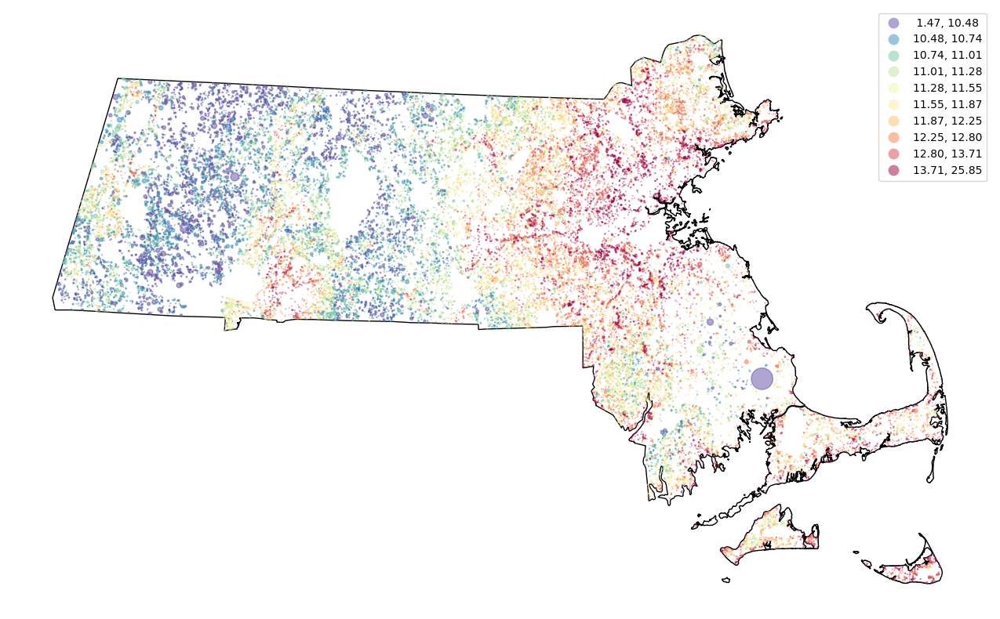

In [296]:
fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols.fittedvalues.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')

create a map of residuals

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

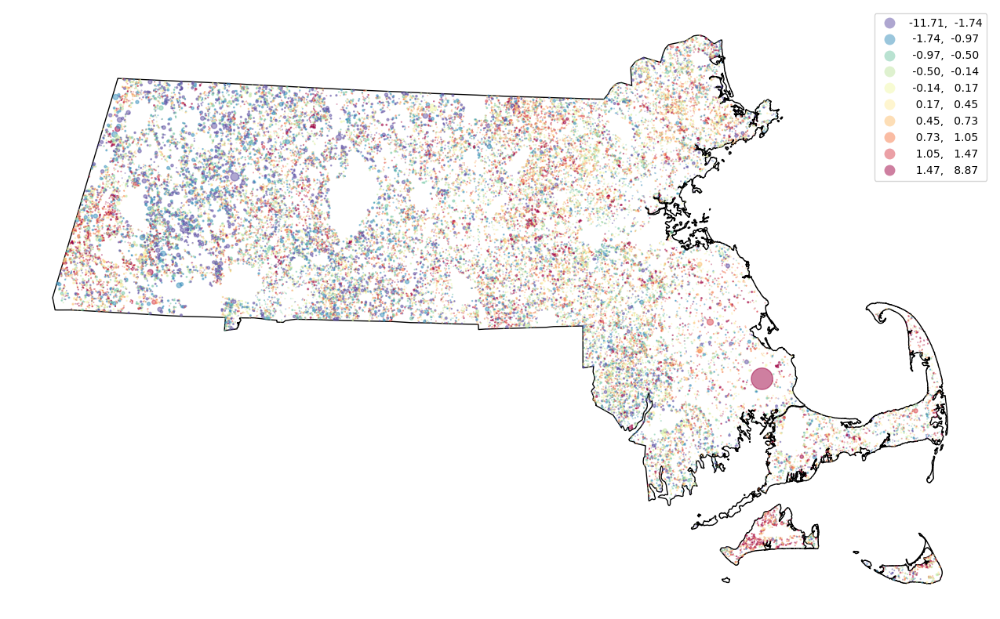

In [297]:
fig, ax = plt.subplots(figsize=(17, 10))
dr = shp_c.join(model_ls_ols.resid.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dr.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')

<Axes: xlabel='ls_year'>

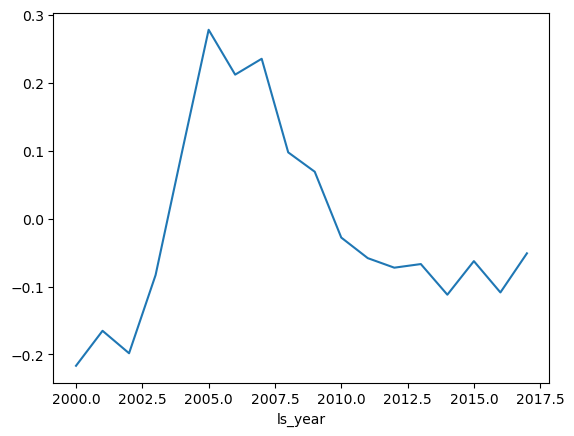

In [298]:
#Let see whether we have a temporal trend in the residuals, by plotting the mean of the residuals in each year against the year.
#We first need to create a DataFrame that has ls_year and the residuals as columns:
df = X_ls[['ls_year']].join(model_ls_ols.resid.rename('resid'))
#Then we use groupby to compute and plot the mean of the residuals by ls_year:
df.groupby('ls_year')['resid'].mean().plot()
#Is this a linear or exponential growth curve – or is something happening around 2008? Exponential



# Mean Squared Error

Our simple visualization of the spatial and temporal patterns of the residuals reveals that there are spatial and temporal patterns that are not well captured by the current model and its covariates. We will try to improve this model. Before we do, we need to define what we mean with "improvement". In other words, we need a measure of prediction error (or “loss function” in machine learning) that we can use as a yardstick to compare all models. In this lab, we will aim to minimize the mean squared error (MSE), or, in other words, the mean of all squared differences between actual values and their corresponding fitted (predicted) values.

In [299]:
#What is the MSE of the current model? As usual, there are several ways to find out. In this case, the simplest one would be:
model_ls_ols.resid.pow(2).mean()


1.9803298297533176

In [300]:
#Alternatively, you can use sklearn's inbuilt functions. We will use this one frequently later:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_ls, model_ls_ols.fittedvalues)


1.9803298297533176

### Improving our MSE

Before we get into spatial models, we can try to remove the (irregular) time trend. One way to do this is by using year dummies. 
- This approach assumes that prices vary across years by an amount that is constant for each year.
-  The constants can be estimated in a regression with dummy variables: for each year except one, we will create a variable that has the value 1 if the sale occurred in that year, and 0 otherwise.
  
  - This approach is called "one hot" encoding
 
  - What is happening here?
    1. We first create a OneHotEncoder object and let if find all the categories (years) automatically by "fitting" it to the ls_year column.
    2. In the next step, we use this object to transform the data in the ls_year column into a 2D-array of dummy values.
    3. In the third step, we turn that array into a DataFrame. We use the index of the input DataFrame ('pid') and the year names as the column names.
       
    *The small list comprehension cuts off an unnecessary prefix ('x0_') from the column names*

In [301]:
#Creating dummy variables using sklearn OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(categories='auto').fit(X_ls[['ls_year']])
dummies_array = enc.transform(X_ls[['ls_year']]).toarray()
dummies_df = pd.DataFrame(
    dummies_array,
    index=X_ls.index,
    columns=[v[8:] for v in enc.get_feature_names_out()],
)


•	Once we have the dummies_df dataframe, we can create a new version of X_ls (let's call it X_ls2) in which we replace the ls_year column with year dummies. 

*Note that we need to choose one reference category (year), and omit it from the regression (we omit '2000').*

In [302]:
X_ls2 = X_ls.drop(columns='ls_year').join(dummies_df).drop(columns='2000')

In [303]:
#Run the regression with the new dataset of explanatory variables X_ls2.
model_ls_ols2 = sm.OLS(y_ls, sm.add_constant(X_ls2)).fit()
model_ls_ols2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.462
Model:                             OLS   Adj. R-squared:                  0.461
Method:                  Least Squares   F-statistic:                     1002.
Date:                 Mon, 20 Nov 2023   Prob (F-statistic):               0.00
Time:                         09:48:52   Log-Likelihood:                -77948.
No. Observations:                44424   AIC:                         1.560e+05
Df Residuals:                    44385   BIC:                         1.563e+05
Df Model:                           38                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          9.7614      0.053    182.862      0.000       9.657       9.866
slope                         -0.0274      0.002    -11.177      0.000      -0.032      -0.023
travel                        -0.0007      0.000     -6.493      0.000      -0.001      -0.000
p_wet                         -0.0051      0.000    -24.486      0.000      -0.005      -0.005
coast_2500                     0.0300      0.001     30.207      0.000       0.028       0.032
river_frontage             -3.626e-05   7.71e-05     -0.471      0.638      -0.000       0.000
lake_frontage                 -0.0007   5.07e-05    -12.922      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.376e-05   1.98e-05     -1.704      0.088   -7.26e-05    5.08e-06
hh_inc_avg_tract_2012-2016  1.316e-05   1.87e-07     70.301      0.000    1.28e-05    1.35e-05
p_f_2000                      -0.0058      0.000    -16.027      0.000      -0.007      -0.005
p_prot_2000_500              8.67e-05      0.001      0.172      0.864      -0.001       0.001
p_d_2000_200                   0.0126      0.001     18.356      0.000       0.011       0.014
p_d_2000_1000                 -0.0004      0.001     -0.486      0.627      -0.002       0.001
p_d_2000_5000                  0.0155      0.001     16.736      0.000       0.014       0.017
p_dev_open                     0.0034      0.001      6.633      0.000       0.002       0.004
p_dev_low                      0.0073      0.001      9.010      0.000       0.006       0.009
p_dev_medium                   0.0146      0.001     19.662      0.000       0.013       0.016
p_dev_high                     0.0040      0.001      5.138      0.000       0.002       0.006
p_crops                       -0.0039      0.001     -4.439      0.000      -0.006      -0.002
p_pasture                     -0.0001      0.001     -0.253      0.801      -0.001       0.001
p_grassland                    0.0021      0.001      2.037      0.042    8.14e-05       0.004
bld_area_per_ha             1.866e-05    6.6e-07     28.272      0.000    1.74e-05       2e-05
2001                           0.0837      0.039      2.160      0.031       0.008       0.160
2002                           0.0817      0.038      2.152      0.031       0.007       0.156
2003                           0.2283      0.038      6.033      0.000       0.154       0.302
2004                           0.4424      0.037     12.035      0.000       0.370       0.514
2005                           0.6535      0.037     17.885      0.000       0.582       0.725
2006                           0.6194      0.037     16.565      0.000       0.546       0.693
2007                           0.6743      0.038     17.898      0.000       0.600       0.748
2008                           0

In [304]:
mean_squared_error(y_ls, model_ls_ols2.fittedvalues)
#now we have an improved MSE value

1.957007091650473

<Axes: >

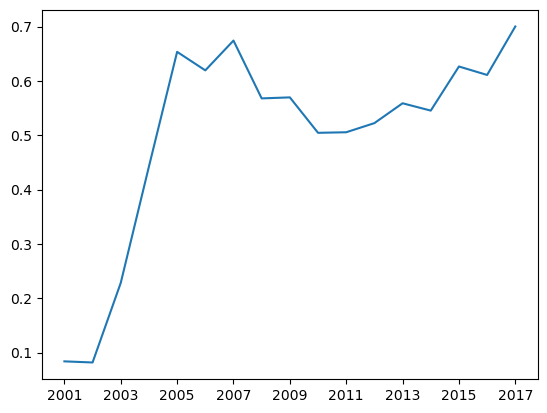

In [305]:
#Plot the coefficient estimates of the year dummies:
model_ls_ols2.params.loc['2001':'2017'].plot()


As with any regression, you can add quadratic terms and interactions between variables. The easiest way to do so is to create additional columns with the values of those quadratic terms and interactions.

In [306]:
#The following code creates a new dataset X_ls3 that includes quadratic terms and interactions for all variables other than the year dummies.
# Add quadratic terms and interactions
from itertools import combinations

X_ls3 = X_ls.drop(columns='ls_year').copy()
cols = X_ls3.columns
for v in cols:
    X_ls3[v + '^2'] = X_ls3[v] ** 2
for v1, v2 in combinations(cols,2):
    X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
X_ls3 = X_ls3.join(dummies_df)


/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_35009/2117139763.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_35009/2117139763.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_35009/2117139763.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.inser

•	Run the regression with the new dataset of explanatory variables X_ls3. Call the model model_ls_ols3. Do you find at least some of the quadratic terms and interactions to be significant? Has model fit improved? How about the spatial patterns of the residuals?

In [307]:
model_ls_ols3 = sm.OLS(y_ls, sm.add_constant(X_ls3)).fit()
model_ls_ols3.summary()
#here we see the model fit has improved whewn we look at the adjusted r^2. 

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.537
Model:                             OLS   Adj. R-squared:                  0.534
Method:                  Least Squares   F-statistic:                     190.2
Date:                 Mon, 20 Nov 2023   Prob (F-statistic):               0.00
Time:                         09:49:12   Log-Likelihood:                -74613.
No. Observations:                44424   AIC:                         1.498e+05
Df Residuals:                    44154   BIC:                         1.521e+05
Df Model:                          269                                         
Covariance Type:             nonrobust                                         
=======================================================================================================================
                                                          coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                   9.6012      0.191     50.254      0.000       9.227       9.976
slope                                                  -0.0174      0.020     -0.877      0.380      -0.056       0.021
travel                                                 -0.0016      0.001     -1.762      0.078      -0.003       0.000
p_wet                                                  -0.0138      0.001    -10.100      0.000      -0.016      -0.011
coast_2500                                              0.0679      0.009      7.977      0.000       0.051       0.085
river_frontage                                          0.0053      0.001      9.006      0.000       0.004       0.006
lake_frontage                                          -0.0021      0.000     -4.445      0.000      -0.003      -0.001
pop_dens_tract_2012-2016                                0.0009      0.000      4.706      0.000       0.001       0.001
hh_inc_avg_tract_2012-2016                           2.146e-05   1.42e-06     15.101      0.000    1.87e-05    2.42e-05
p_f_2000                                               -0.0146      0.003     -5.670      0.000      -0.020      -0.010
p_prot_2000_500                                         0.0017      0.004      0.484      0.629      -0.005       0.009
p_d_2000_200                                            0.0138      0.004      3.101      0.002       0.005       0.022
p_d_2000_1000                                           0.0258      0.006      4.535      0.000       0.015       0.037
p_d_2000_5000                                          -0.0066      0.006     -1.053      0.292      -0.019       0.006
p_dev_open                                              0.0025      0.003      0.817      0.414      -0.003       0.008
p_dev_low                                              -0.0023      0.005     -0.430      0.667      -0.013       0.008
p_dev_medium                                            0.0095      0.006      1.580      0.114      -0.002       0.021
p_dev_high                                             -0.0162      0.008     -1.902      0.057      -0.033       0.000
p_crops                                                 0.0026      0.007      0.348      0.728      -0.012       0.017
p_pasture                                              -0.0241      0.004     -6.016      0.000      -0.032      -0.016
p_grassland                                            -0.0202      0.007     -2.732      0.006      -0.035      -0.006
bld_area_per_ha                                      5.731e-05   5.32e-06     10.776      0.000    4.69e-05    6.77e-05
slope^2                                                 0.0009      0.00

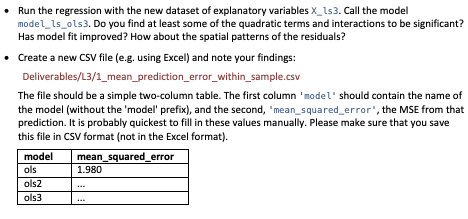s3	...


#### Residuals Map for model_ls_ols3

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


Text(0.5, 1.0, 'Map of residuals for model_ls_ols3')

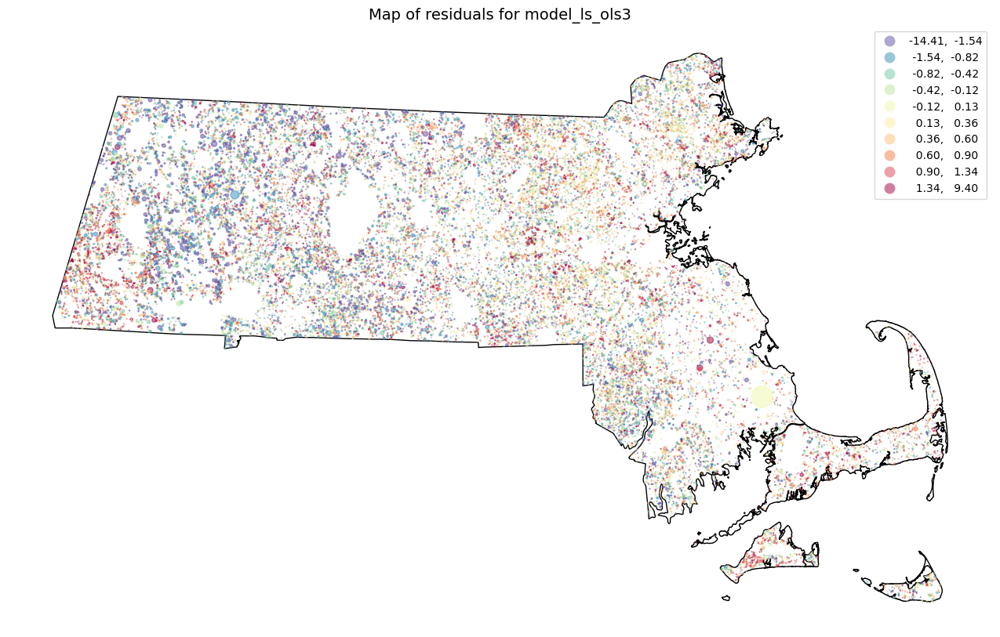

In [308]:
fig, ax = plt.subplots(figsize=(17, 10))
d3 = shp_c.join(model_ls_ols3.resid.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
d3.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')
ax.set_title('Map of residuals for model_ls_ols3', fontsize=14)

#filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/1_ls_ols3_resid.png'
#plt.savefig(filename,bbox_inches='tight', dpi=150)

#### Map of predicted values for model_ls_ols3

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


Text(0.5, 1.0, 'Map of predicted values for model_ls_ols3')

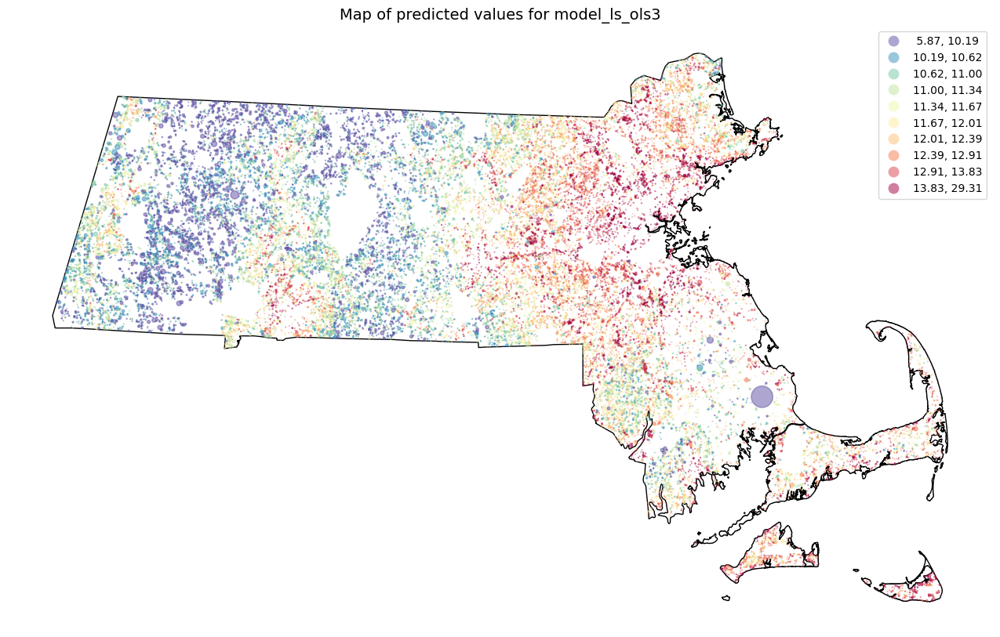

In [309]:
fig, ax = plt.subplots(figsize=(17, 10))
d3p = shp_c.join(model_ls_ols3.fittedvalues.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
d3p.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')
ax.set_title('Map of predicted values for model_ls_ols3', fontsize=14)

#filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/1_ls_ols3_pred.png'
#plt.savefig(filename,bbox_inches='tight', dpi=150)

MSE for model_ls_ols3

In [310]:
mean_squared_error(y_ls, model_ls_ols3.fittedvalues)

1.6841173295572491

# C)	Linear regressions and predictive modeling in scikit-learn

In [311]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import (
    ExtraTreesRegressor, 
    GradientBoostingRegressor, 
    RandomForestRegressor
)
from sklearn.model_selection import train_test_split, KFold


In [312]:
#first defining the model and then fitting and predicting
#step 2: switching the model from LinearRegression() to GradientBoostingRegressor
# step3: switching the model from GradientBooster to RandomForest
# Step4: switching the model from RandomForest to ExtraTrees
model = ExtraTreesRegressor(n_estimators=50)
model.fit(X_ls, y_ls)
model.predict(X_ls)

array([11.84050403, 11.38964645, 11.7766543 , ...,  6.78076798,
       12.32254007,  8.5668976 ])

In [313]:
#obtaining the MSE of the predicted model
mean_squared_error(y_ls, model.predict(X_ls))

6.021920810023774e-29

- One downside of working with scikit-learn is that there is no summary() function for the OLS regression that gives you a good overview of model quality. Only coefficient estimates can be obtained from the model object of a regression (model.coef_). If you need their significance levels, or indicators of model fit (such as R-squared, AIC, etc.) you have to compute these yourself, e.g. using `sklearn.metrics.r2_score`, or run the regression in `statsmodels` instead.

•	How good is the out-of-sample prediction of our simple linear model? To find out, we need to split our original dataset randomly into training and testing subsets, fit the model on the training sample, and test its predictive accuracy with the test sample. One way to do this is to use sklearn's function train_test_split, which does the random splitting for you.

In [314]:
X_train, X_test, y_train, y_test = train_test_split(X_ls, y_ls) #splitting into training and testing
model.fit(X_train, y_train) #fitting the linear regression model onto our xtrain and ytrain
mean_squared_error(y_test, model.predict(X_test)) #retrieving the MSE of out predict model on our test variables


1.3108043865029113

- use `k-fold cross validation`: this approach splits the original dataset into k different "folds" (subsets) of equal size (where k is some integer value). It then estimates k models, where each model is trained on a sample that consists of k-1 batches (leaving out one batch), and then tested with the batch that was not used for fitting the model. The resulting MSE values are averaged across all models. This approach guarantees that each observation is used only once for validation, which makes the test statistics more robust to outliers.

1.  First, we assign the dataset we want to use to X and y.
     - The reason for doing so is that it allows us to switch out datasets quickly (e.g. X_ls2, X_ls3, X_fc) without having to edit multiple lines.
     *Careful: always make sure X and y have the same order and index of observations!*
     -  We also create two empty lists (mse_train and mse_test) in which we store the MSEs for within-sample and out-of-sample predictions, respectively.
  
2.  	We then create a KFold object, let it know how many folds we want to use n_splits = (5), and indicate that we want to shuffle the dataset before splitting it. This shuffling is important if you have a dataset that is ordered in ways that introduces systematic differences between parts of the dataset
   
     -  Here, the dataset is ordered by Massachusetts counties. If we were to fit a model on training data from some counties, and then tried to predict the outcomes in a test sample that’s mostly from another county, prediction errors will be larger than if we fit the model to a random sample and use it to predict another random sample 
 
  .3.   •	The KFold.split(X) function returns an iterator. For each iteration in the for loop, this iterator returns a tuple. The first element of that tuple is an array of the row numbers (not the index!) for the training sample (here assigned to i_train). The second element of the tuple is an array of the row numbers of the test sample (here assigned to i_test
   
   
  )4.  
•	Using those arrays, we can obtain the training and test samples for each iteration with X.iloc[...] and y.iloc[..
   
  .5.  
•	np.mean returns the average of the lists of MSEs (which is fine to use here as a measure of overall performance, as each fold is approximately the same size).


In [315]:
# K-fold cross validation on X_ls, and y_ls (First model)
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))


Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.3481


In [41]:
# Using X_ls2
X = X_ls2
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))


Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.3735


In [42]:
# Using X_ls3
X = X_ls3
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))


Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.3656


	Create a csv file to start documenting the average out-of-sample MSE you get for each model. Give the three models the same name that you used above (ols, ols2, ols3).
Deliverables/L3/1_mean_prediction_error_out_of_sample.csv
-	Note: this is a different CSV file with a different name than the previous one!


### All of the three ensemble methods we have used allow you to inspect the relative importance of the predictor variables (called "features" in machine learning).

### The higher the feature importance, the more important the feature is for predicting the outcome. 

### More specifically, a feature gets a higher importance value if its splits can separate high from low outcome values (prices) by a higher amount and for a higher share of observations

<Axes: >

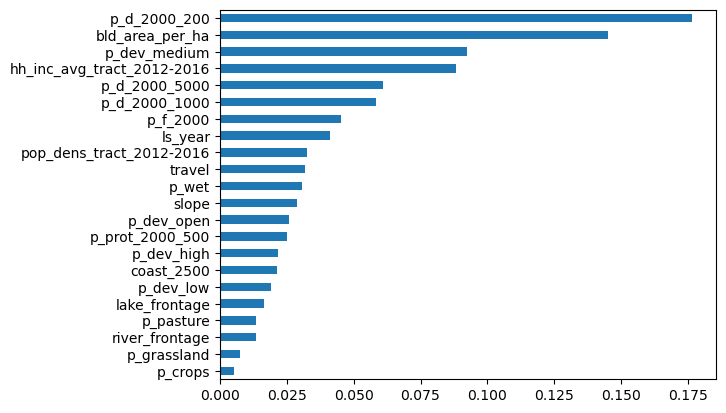

In [316]:
#in this code I am using model = ExtraTreesRegressor, and with the model ols. 
feat_imp = pd.Series(model.feature_importances_, index=X.columns)
feat_imp.sort_values().plot(kind='barh')


Do the residuals of our models exhibit any spatial pattern? Let's find out:
- If we were to follow the same logic for computing and plotting residuals as in the linear regression examples, we could compute and map the difference between the model predictions and the observed values as follows


/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


<Axes: >

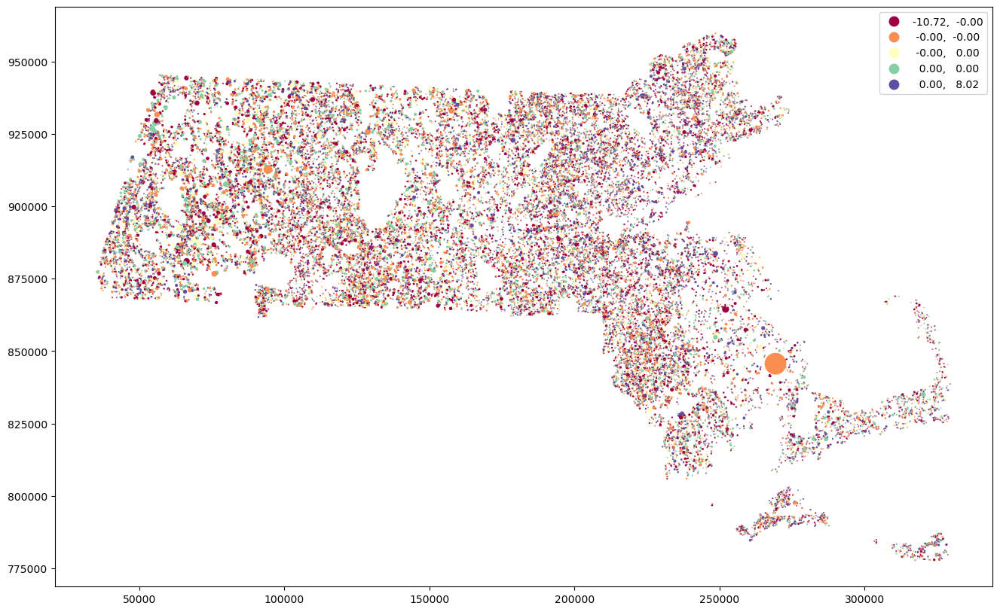

In [317]:
#our model = ExtraTreesRegressor here and modelols
y_pred = pd.Series(model.predict(X), index=X.index) #model.predict returns array
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')
shp_p.plot(
    'resid',
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)


- However, as we have just learned, computing the residuals in this way is very misleading, especially for random forests and extremely randomized trees.
  
- To get a sense of how the prediction error is actually distributed, we should only be allowed to use predictions from models that have not seen the observations whose values are to be predicted. There are a few ways we could achieve that:
   - One, we could use a cross-validation approach as above, using only part of the training data to predict the remainder.
   - Two, for random forests and extremely randomized trees, there exists an easier option: out-of-bag estimates. Out-of-bag (OOB) estimates are predictions that are based only on decision trees that haven't seen the observation whose value they are asked to predict.
   - In sklearn, you can compute OOB estimates by passing the arguments bootstrap=True and oob_score=True to the ExtraTreesRegressor or RandomForestRegressor.

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


<Axes: >

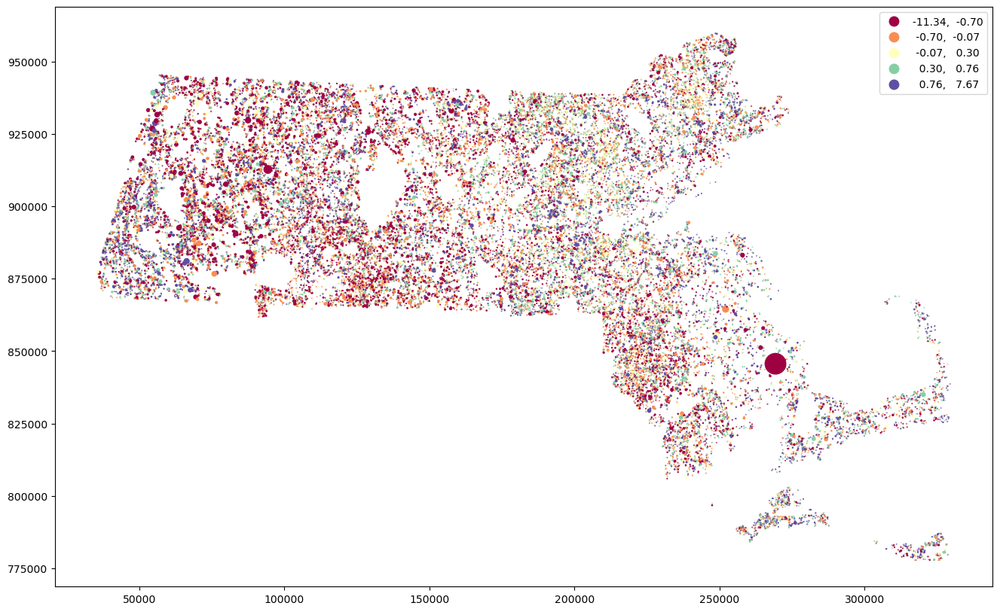

In [318]:


model = ExtraTreesRegressor(n_estimators=50, bootstrap=True, oob_score=True)
model.fit(X, y)
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')
shp_p.plot(
    'resid',
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)


*in the above map, the range differs from that of the map previous sto this one.*


•	To incorporate differences across space that are not captured by our other variables, we can add x and y coordinates of each parcel to X_ls. Create a dataframe with the x and y coordinates of the centroids:

In [319]:
shp_c['x'] = shp_c['geometry'].x
shp_c['y'] = shp_c['geometry'].y
coords = shp_c[['x', 'y']]


Run the cross-validation with the three above methods and an input dataset that contains both X_ls and coords:

1. Running the model with GradientBoostingRegressor()
2. RandomForestRegressor(n_estimators=20)
3. ExtraTreesRegressor(n_estimators=50)

In [135]:
model = ExtraTreesRegressor(n_estimators=50)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))


Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.2842


All three ensemble-based methods have hyperparameters that you can tune to improve the predictive power of your model. An important one is the number of estimators used to fit the model (n_estimators). In boosted regressions, n_estimators refers to the number of boosting stages. In random forests and extremely randomized trees, it refers to the number of trees.

•	Increase the number of boosting stages in your boosted regression from 100 to 1000. What average out-of-sample MSE do you get? Note it in the CSV (gb_coords_1000), 
- 

In [138]:
model = GradientBoostingRegressor(n_estimators=1000)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))


Avg MSE (within-sample): 1.0272
Avg MSE (out-of-sample): 1.3142


•	Increase the number of trees in your random forests and extremely random trees from 20 and 50 to 100. What average out-of-sample MSE do you get? Note them in the CSV (rf_coords_100, et_coords_100).

In [139]:
#RandomForestRegressor: rf_coords_100
model = RandomForestRegressor(n_estimators=100, oob_score=True)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1835
Avg MSE (out-of-sample): 1.3017


In [140]:
#ExtraTreesRegressor: et_coords_100
model = ExtraTreesRegressor(
    n_estimators=100, bootstrap=True, oob_score=True
)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1814
Avg MSE (out-of-sample): 1.292


## For the rest of this section, we will work with an extremely randomized trees regressor with 250 estimators.

•	Go ahead and compute the out-of-sample MSE of this model using the above k-fold cross-validation method. Note it in the CSV (et_coords_250).

In [341]:
#ExtraTreesRegressor: et_coords_250
model = ExtraTreesRegressor(
    n_estimators=250, bootstrap=True, oob_score=True, n_jobs =-1
)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1766
Avg MSE (out-of-sample): 1.2799


In [331]:
#rfr: rf_coords_100
model = RandomForestRegressor(
    n_estimators=100, bootstrap=True, oob_score=True, n_jobs =-1
)
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1836
Avg MSE (out-of-sample): 1.2996


Once we are satisfied with the choice of our predictive model, we can create predictions of land value for the entire state of Massachusetts.

- Find the largest sample of parcels for which we can predict land cost. It is the subset of all unprotected parcels for which all covariates (minus the year of sale) exist. We also need to set a year for which we would like to make the prediction (2010 here).


In [342]:
xcols_ls_pred = [v for v in XCOLS_LS if v != 'ls_year']
i_ls_pred = d[xcols_ls_pred].isnull().sum(1).eq(0) & d['p_prot'].le(5)
X_ls_pred = d.loc[i_ls_pred, xcols_ls_pred]
X_ls_pred['ls_year'] = 2010


•	We then fit our favorite model to the full sale data sample (`X_ls.join(coords`) and `y_ls`) and predict land conservation cost for all unencumbered parcels for which we have data.

In [343]:
model = ExtraTreesRegressor(
    n_estimators=250, n_jobs=-1, bootstrap=True, oob_score=True
) 
model.fit(X_ls.join(coords), y_ls)
y_pred = pd.Series(
    model.predict(X_ls_pred.join(coords)), index=X_ls_pred.index
)


In [344]:
#here i am just making sure that I am including all 177277 parcels in the map. 
y_pred

pid
F_803174_3027860    12.838029
M_238118_942044     12.114870
M_240445_943056     12.675377
M_245474_951109     12.077671
F_778757_3113679    10.864916
                      ...    
M_74987_889210       9.528496
F_182440_2984399    10.650474
M_74001_894053       9.027704
M_67459_886161       9.452550
F_172467_2984485    11.142077
Length: 177277, dtype: float64

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


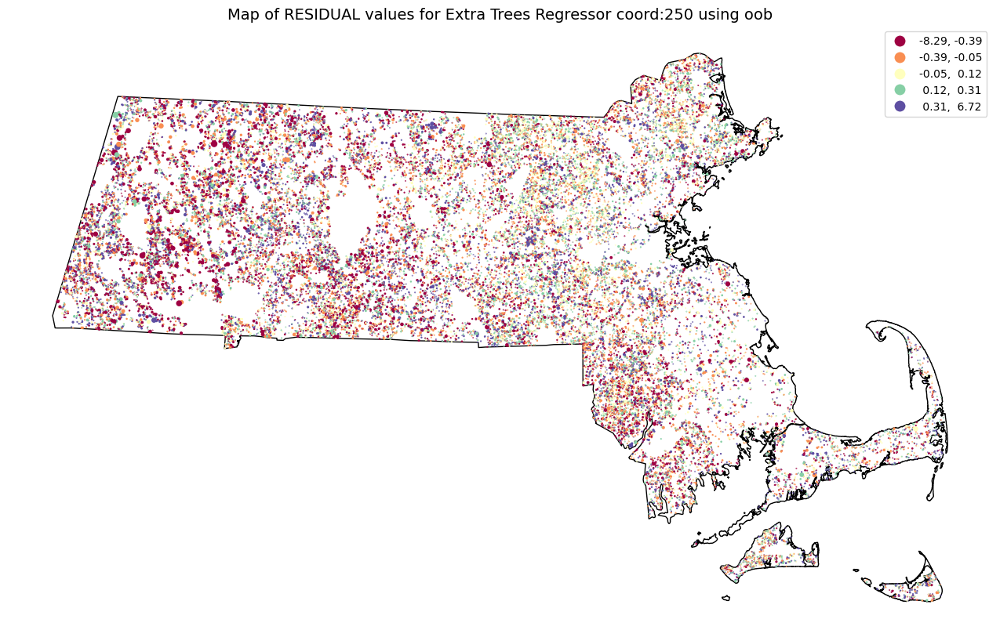

In [345]:
#map for etcoords_250: 
fig, ax = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
resid_et_250 = (y - y_pred).rename('resid')
shp_et_250 = shp_c.join(resid_et_250, how='inner')
shp_et_250.plot(
    'resid',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)

ax.axis('off')
ax.set_title('Map of RESIDUAL values for Extra Trees Regressor coord:250 using oob', fontsize=14)

# Assuming you want to save the figure
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/l3/1_ls_et_coords_250_resid.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()  # Display the plot

### prediction map et_coords_250:	
- For the map of predictions, make sure you're including all 177,277 parcels in the map (not only the ones that sold). To keep things simple, you don't need to use OOB predictions for the parcels that were also part of the training data, i.e. you can use the full set of predictions from model.predict(). If you wanted to create a map of actual predictions, you would have to identify the training observations, and replace their predictions from model.predict() with OOB predictions.

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


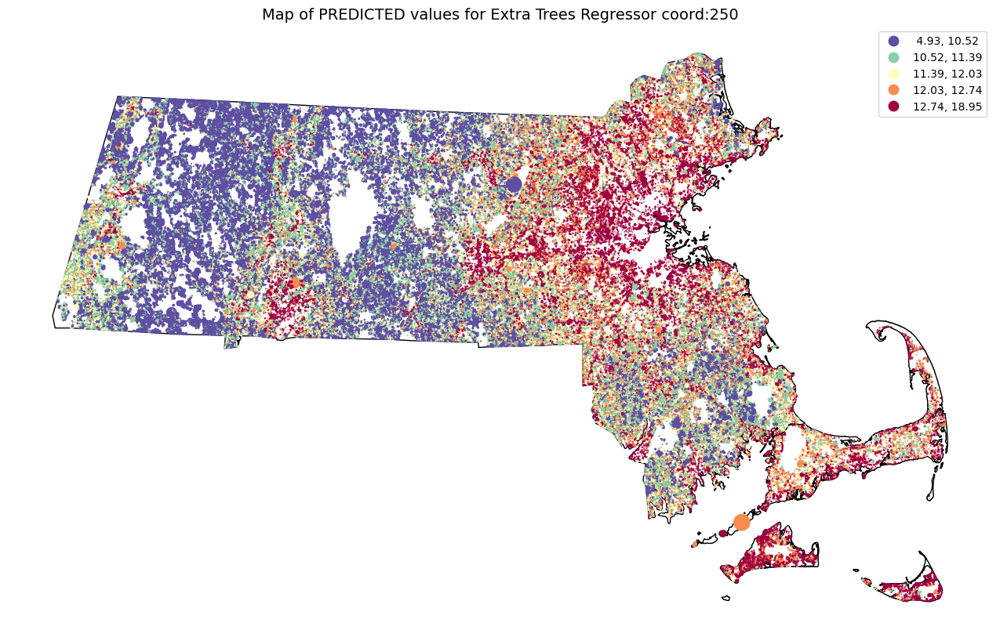

In [346]:
fig, ax = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
pred_et_250 = y_pred.rename('pred')
shp_et_250_pred = shp_c.join(pred_et_250, how='inner')

# Plot the map
shp_et_250_pred.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r',
)

ax.axis('off')
ax.set_title('Map of PREDICTED values for Extra Trees Regressor coord:250', fontsize=14)


# Assuming you want to save the figure
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/l3/1_ls_et_coords_250_pred.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()  # Display the plot

# creating a map for rf_coords_100 using same steps as for et_coords_250

In [333]:
#rf_coords100
model = RandomForestRegressor(
    n_estimators=100, n_jobs=-1, bootstrap=True, oob_score=True
) 
model.fit(X_ls.join(coords), y_ls)
y_pred = pd.Series(
    model.predict(X_ls_pred.join(coords)), index=X_ls_pred.index
)



/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


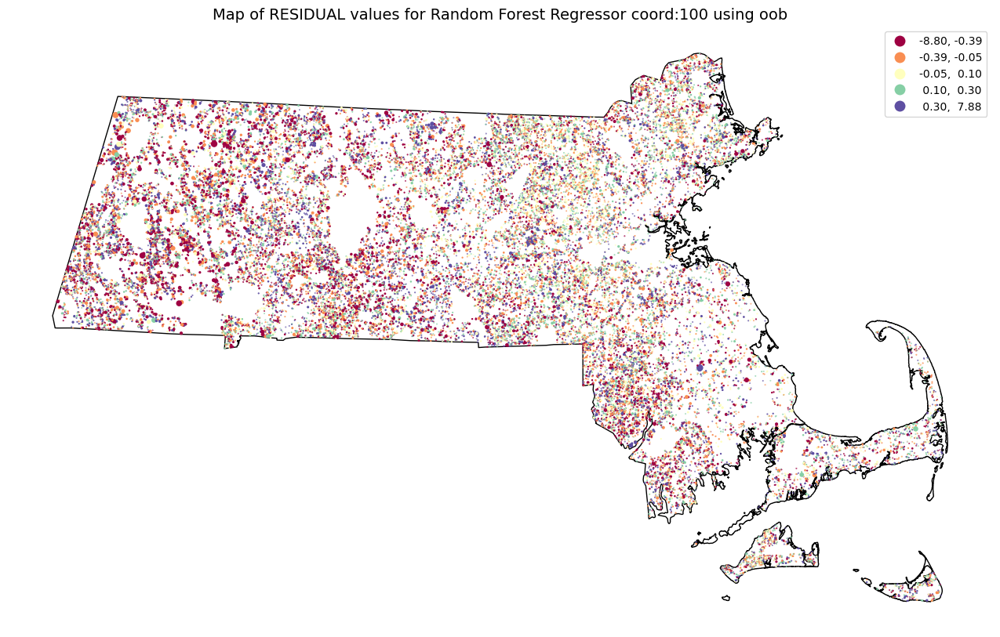

In [340]:
#Residuals map for rf_coords_100
fig, ax1 = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax1, color='none', edgecolor='black')
resid_rf_100 = (y - y_pred).rename('resid')
shp_rf_100 = shp_c.join(resid_rf_100, how='inner')
shp_rf_100.plot(
    'resid',
    ax=ax1,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)

ax1.axis('off')
ax1.set_title('Map of RESIDUAL values for Random Forest Regressor coord:100 using oob', fontsize=14)

# Assuming you want to save the figure
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/l3/1_ls_rf_coords_100_resid.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()  # Display the plot

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


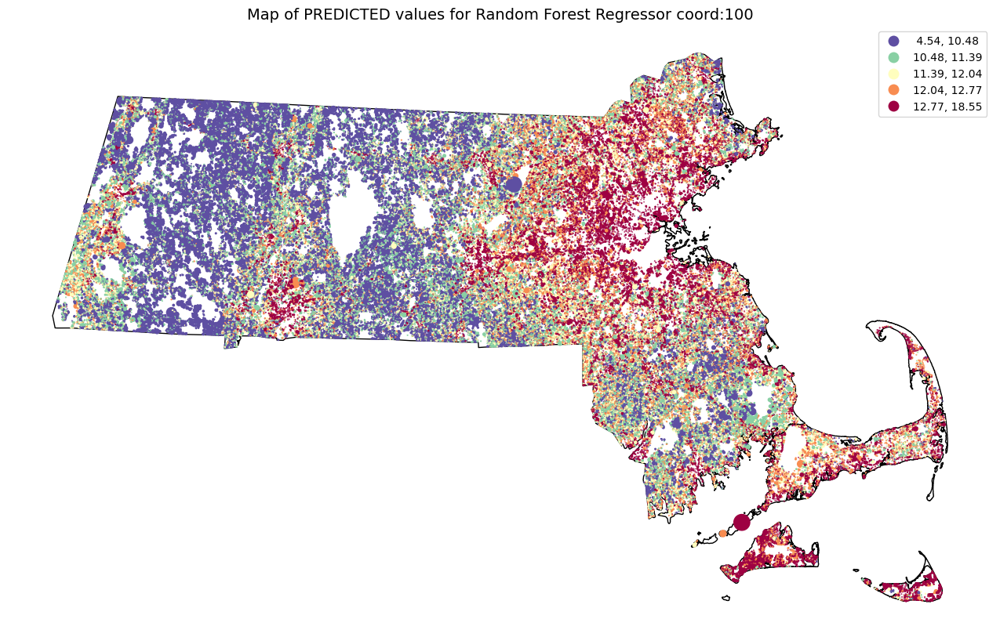

In [339]:
#predicted map for rf_coords100
fig, ax = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
pred_rf_100 = y_pred.rename('pred')
shp_rf_100_pred = shp_c.join(pred_rf_100, how='inner')

# Plot the map
shp_rf_100_pred.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r',
)

ax.axis('off')
ax.set_title('Map of PREDICTED values for Random Forest Regressor coord:100', fontsize=14)


# Assuming you want to save the figure
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/l3/1_ls_rf_coords_100_pred.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()  # Display the plot

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


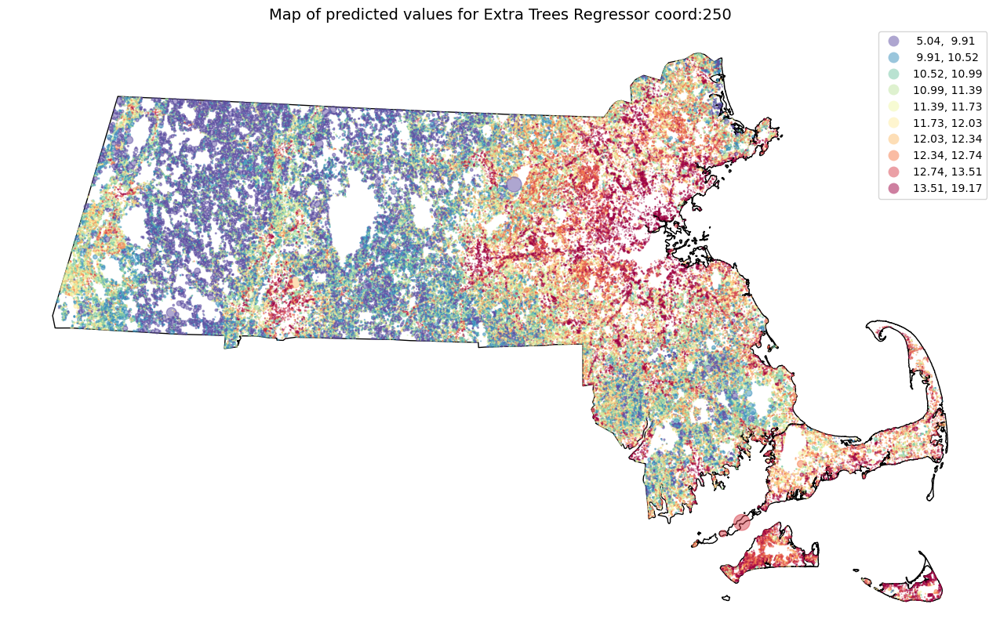

In [238]:
fig, ax = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
pred = y_pred.rename('pred')
shp_etpred = shp_c.join(pred, how='inner')

# Plot the map
shp_etpred.plot(
    'pred',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r',
    k=10,
    alpha=0.5,
)

ax.axis('off')
ax.set_title('Map of predicted values for Extra Trees Regressor coord:250', fontsize=14)


# Assuming you want to save the figure
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/l3/1_ls_et_coords_250_pred.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()  # Display the plot


In [166]:
shp_etpred

,geometry,ms,pred
pid,,,
F_803174_3027860,POINT (244807.918 922893.447),0.1138,12.942924
M_238118_942044,POINT (238099.159 942052.146),0.3052,12.118399
M_240445_943056,POINT (240370.270 943069.127),0.2165,12.688351
M_245474_951109,POINT (245504.973 951081.296),0.2162,12.066189
F_778757_3113679,POINT (237365.539 949051.159),0.7070,10.861493
...,...,...,...
M_74987_889210,POINT (74964.318 889192.178),8.9442,9.524688
F_182440_2984399,POINT (55607.857 909646.744),9.0803,10.533301
M_74001_894053,POINT (73996.942 894045.145),9.5959,9.003646


In [167]:
shp_et

,geometry,ms,resid
pid,,,
F_803174_3027860,POINT (244807.918 922893.447),0.1138,NaN
M_238118_942044,POINT (238099.159 942052.146),0.3052,NaN
M_240445_943056,POINT (240370.270 943069.127),0.2165,NaN
M_245474_951109,POINT (245504.973 951081.296),0.2162,-0.225685
F_778757_3113679,POINT (237365.539 949051.159),0.7070,0.528153
...,...,...,...
M_74987_889210,POINT (74964.318 889192.178),8.9442,-0.957790
F_182440_2984399,POINT (55607.857 909646.744),9.0803,NaN
M_74001_894053,POINT (73996.942 894045.145),9.5959,NaN


## Random Forest Regressor n_estimators=100

In [173]:
modelrf = RandomForestRegressor(n_estimators=100,oob_score=True)
modelrf.fit(X_ls.join(coords), y_ls)
y_predrf = pd.Series(
    modelrf.predict(X_ls_pred.join(coords)), index=X_ls_pred.index
)


## Random Forest Residual Map coord=100

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


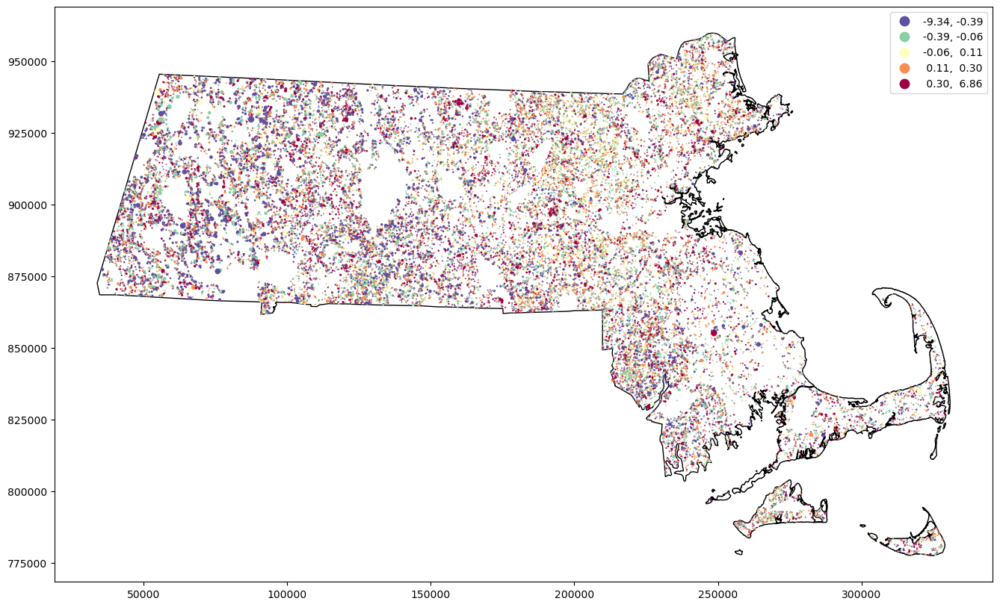

In [171]:
fig1, ax1 = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax1, color='none', edgecolor='black')
resid_rf = (y - y_predrf).rename('resid')
shp_rf_resid = shp_c.join(resid_rf, how='inner')
shp_rf_resid.plot(
    'resid',
    ax=ax1,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r'
)
ax.axis('off')
ax.set_title('Map of residual values for Random Forest Regressor coord:100', fontsize=14)

filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/1_ls_rf_coords_100_resid.png'
plt.savefig(filename,bbox_inches='tight', dpi=150)

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


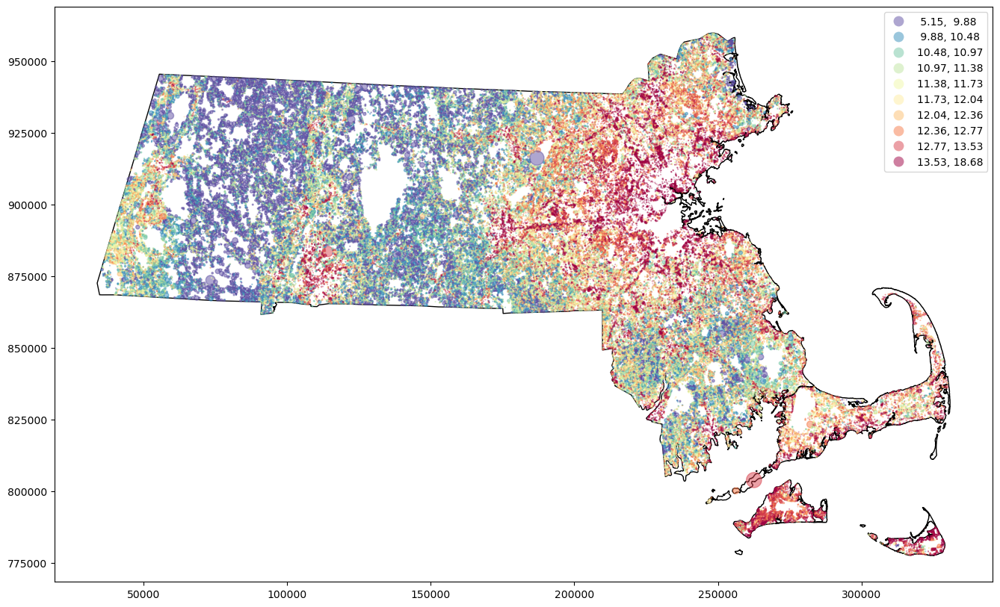

In [174]:

fig2, ax2 = plt.subplots(figsize=(17,10))
shp_ma_outline.plot(ax=ax2, color='none', edgecolor='black')
pred_reg = y_predrf.rename('pred')
shp_regpred = shp_c.join(pred_reg, how='inner')

# Plot the map
shp_regpred.plot(
    'pred',
    ax=ax2,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r',
    k=10,
    alpha=0.5,
)
ax.axis('off')
ax.set_title('Map of predicted values for Random Forest Regressor coord:100', fontsize=14)

filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/1_ls_rf_coords_100_pred.png'
plt.savefig(filename,bbox_inches='tight', dpi=150)

# E)  Predicting Forest Change

In [347]:
#ExtraTreesRegressor: et_coords_250
model = ExtraTreesRegressor(
    n_estimators=250, bootstrap=True, oob_score=True, n_jobs =-1
)
X = X_fc.join(coords)
y = y_fc
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 7.9001
Avg MSE (out-of-sample): 57.4631


In [348]:
xcols_fc_pred = [v for v in XCOLS_FC if v != 'ls_year']
i_fc_pred = d[xcols_fc_pred].isnull().sum(1).eq(0) & d['p_prot'].le(5)
X_fc_pred = d.loc[i_fc_pred, xcols_fc_pred]
X_fc_pred['ls_year'] = 2010

In [349]:
forest_change_model = ExtraTreesRegressor(n_estimators=250, bootstrap=True, oob_score=True)
forest_change_model.fit(X_fc.join(coords), y_fc)

ExtraTreesRegressor(bootstrap=True, n_estimators=250, oob_score=True)

/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


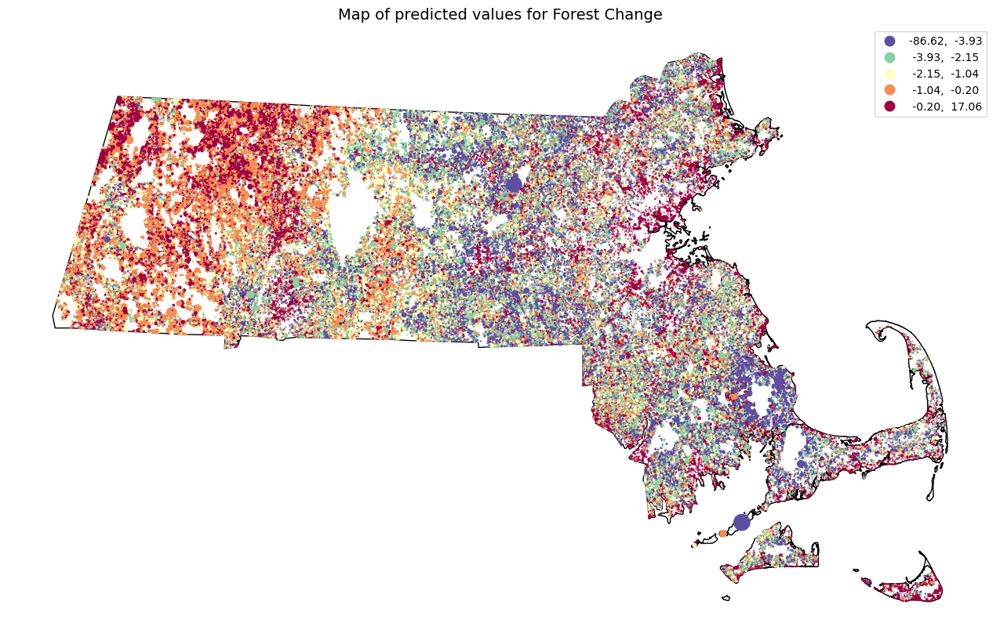

In [351]:
fig3, ax3 = plt.subplots(figsize=(17, 10))

y_pred_fc = pd.Series(forest_change_model.oob_prediction_, index=X_fc.index)
predfc = y_pred_fc.rename('pred')
shp_fc = shp_c.join(predfc, how='inner')
shp_ma_outline.plot(ax=ax3, color='none', edgecolor='black')
shp_fc.plot(
    'pred',
    ax=ax3,
    markersize='ms',
    #alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    #k=10,
    legend=True
)
ax3.axis('off')
ax3.set_title('Map of predicted values for Forest Change', fontsize=14)

filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/1_fc_et_pred.png'
plt.savefig(filename,bbox_inches='tight', dpi=150)


In [352]:
shp_fc

,geometry,ms,x,y,pred
pid,,,,,
F_803174_3027860,POINT (244807.918 922893.447),0.1138,244807.918261,922893.447016,-14.573171
M_238118_942044,POINT (238099.159 942052.146),0.3052,238099.159184,942052.145791,-1.084337
M_240445_943056,POINT (240370.270 943069.127),0.2165,240370.270250,943069.127091,-4.494949
M_245474_951109,POINT (245504.973 951081.296),0.2162,245504.972878,951081.295603,0.000000
F_778757_3113679,POINT (237365.539 949051.159),0.7070,237365.539218,949051.159262,-4.684211
...,...,...,...,...,...
M_74987_889210,POINT (74964.318 889192.178),8.9442,74964.317677,889192.177785,-0.545455
F_182440_2984399,POINT (55607.857 909646.744),9.0803,55607.856848,909646.744307,-1.625000
M_74001_894053,POINT (73996.942 894045.145),9.5959,73996.941608,894045.144726,-0.376238


# 2:	Modeling policies: land acquisitions to avoid carbon emissions from forests

## a)	Quantifying return-on-investment (ROI) at the parcel scale

In [960]:

# Import predictions dataset
predictions_path = "/Volumes/Class_Folders/ee_508/Class_Share/Data/Lab3/y_predictions.csv"
predictions = pd.read_csv(predictions_path)
predictions.set_index('pid', inplace=True)

# Assuming 'd' is another dataset
# Assuming 'd' has been previously loaded and has a column 'pid'
dm = pd.merge(d, predictions, how='inner', on='pid')


•	Given the above assumptions, compute what percentage of each parcel is expected to change from forest to non-forest over the next 100 years (i.e. five twenty-year periods). Account for the fact that we are likely to be underestimating forest change by a factor of 2. Switch the sign of the estimate (make one of the multipliers negative), so forest loss is measured in positive numbers. Clip (censor) the resulting numbers to the plausible range (i.e. no more than the forest existing in 2010 can be lost, and we ignore forest growth

In [961]:
#percentage of each parcel predicted forest loss in next 100 years
dm['p_f_loss_pred_100yr'] = dm['fc_pred'].mul(-10).clip(upper=dm['p_f_2010'], lower=0)


•	Compute how many hectares of forest we expect to be lost on each parcel. We need to divide the percentage change by 100 (to get a value between 0 and 1) and multiply with the parcel size:

In [962]:
#hectacres forest loss for each parcel
dm['ha_f_loss_pred_100yr'] = dm['p_f_loss_pred_100yr'] * dm['ha'] / 100

•	Compute how many tons of CO2 we expect to be lost on each parcel due to conversion

In [963]:
#predicted C02 loss in next 100 years (tonns)
dm['tco2_loss_pred_100yr'] = dm['ha_f_loss_pred_100yr'] * 400


•	Convert the predicted per-ha log sale price back to USD

In [964]:
dm['acq_cost_pred_usd'] = np.exp(dm['ls_pred']) * dm['ha']


•	Estimate the conservation easement costs per ton of expected avoided CO2 emissions.

In [965]:
dm['ce_cost_pred_usd'] = dm['acq_cost_pred_usd'] * 0.4


•	Compute the conservation easement cost per ton of expected avoided CO2 emissions

In [966]:
#easement per ton
dm['ce_cost_$/tco2'] = dm['ce_cost_pred_usd'] / dm['tco2_loss_pred_100yr']
dm

,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,hh_inc_avg_bg_2012-2016,hh_inc_avg_tract_2012-2016,ls_pred,fc_pred,p_f_loss_pred_100yr,ha_f_loss_pred_100yr,tco2_loss_pred_100yr,acq_cost_pred_usd,ce_cost_pred_usd,ce_cost_$/tco2
pid,,,,,,,,,,,,,,,,,,,,,
F_803174_3027860,25009,16250,1.138,3.269,8.000,0.0,0.000,0.0,0.0,0.000,...,107637.264151,111868.256722,12.870125,-2.555327,25.553266,0.290796,116.318467,4.421471e+05,1.768588e+05,1520.470734
M_238118_942044,25009,27620,3.052,6.315,14.000,10.0,0.000,0.0,0.0,0.000,...,127585.099685,115417.941953,12.174028,-4.203807,42.038072,1.283002,513.200788,5.911501e+05,2.364600e+05,460.755421
M_240445_943056,25009,27620,2.165,2.538,20.000,48.0,0.000,0.0,0.0,0.000,...,127585.099685,115417.941953,12.654431,-1.659536,16.595360,0.359290,143.715815,6.779651e+05,2.711860e+05,1886.960249
M_245474_951109,25009,77150,2.162,1.784,19.000,21.0,7.000,0.0,0.0,0.000,...,168559.326425,163715.534591,12.026018,0.174528,0.000000,0.000000,0.000000,3.611510e+05,1.444604e+05,inf
F_778757_3113679,25009,29405,7.070,7.645,8.000,4.0,4.133,0.0,0.0,0.000,...,102680.276817,86602.895054,10.537294,-2.453324,24.533243,1.734500,693.800098,2.665067e+05,1.066027e+05,153.650451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_74987_889210,25003,4545,89.442,9.172,41.429,7.0,0.000,0.0,381.2,148.681,...,89094.137931,87422.722723,8.879863,0.089586,0.000000,0.000000,0.000000,6.427128e+05,2.570851e+05,inf
F_182440_2984399,25003,53960,90.803,4.407,48.250,36.0,0.000,0.0,1836.0,3245.908,...,88131.578947,94874.911482,10.725508,-1.071956,10.719564,9.733686,3893.474327,4.131704e+06,1.652682e+06,424.474795
M_74001_894053,25003,4545,95.959,7.229,152.000,31.0,0.000,0.0,1090.4,3458.145,...,89094.137931,87422.722723,8.929642,-0.356848,3.568485,3.424282,1369.712835,7.247360e+05,2.898944e+05,211.646127


/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):
/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 10 classes. Setting k to 9.
  warnings.warn(
/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/mapclassify/classifiers.py:894: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
/Users/cecilywang/miniconda3/envs/ee508/lib/python3.11/site-packages/mapclassify/classifiers.py:916: RuntimeWarning: invalid value encountered in subtract
  ycd = np.abs(yc - yc_med)


Text(0.5, 1.0, 'Map of the conservation easement cost per ton of expected avoided CO2 emissions')

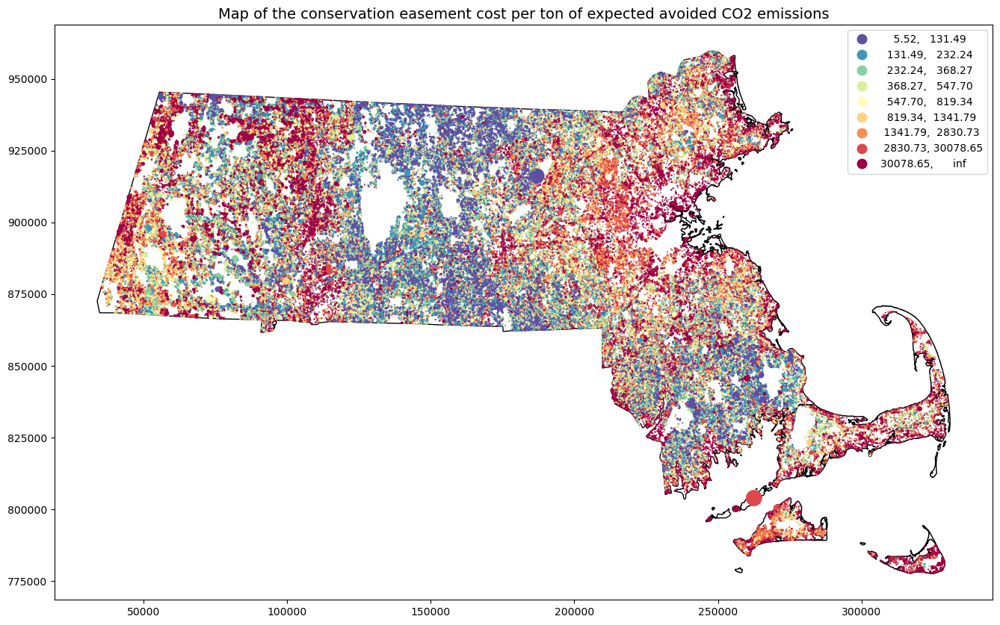

In [428]:
fig4, ax4 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax4, color='none', edgecolor='black')
shp_c.join(dm['ce_cost_$/tco2']).plot(
    column='ce_cost_$/tco2',
    ax=ax4,
    markersize='ms',
    k=10,
    scheme='quantiles',
    legend=True,
    cmap='Spectral_r',
)

ax4.set_title(
    'Map of the conservation easement cost per ton of expected avoided CO2 emissions',
    fontsize=14,
)

#filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_ce_cost_usd_per_tco2.png'
#plt.savefig(filename,bbox_inches='tight', dpi=150)

## b)	Estimating the supply curve for avoided emissions

In [952]:
# Sort the parcels from low to high prices per ton of avoided carbon
sorted_dm = dm.sort_values(by='ce_cost_$/tco2')

#use cumsum()to create a new column that aggregates the tons of carbon avoided from the cheapest to the most expensive ton
sorted_dm['cum_tco2'] = sorted_dm['tco2_loss_pred_100yr'].cumsum()

# Select all parcels that offer avoided CO2 savings at less than 1,000 $/tCO2
selected_dm = sorted_dm[sorted_dm['ce_cost_$/tco2'] <= 1000]


Supply Curve: y-axis = `$/tco2`, x-axis shows the total quantity of a good obtained at that price (here: total avoided CO2 emissions in tons)-> `ce_cost_pred_usd`

REMEMBER: the supply curve is constructed by sorting all offers from the lowest to the highest price per unit.

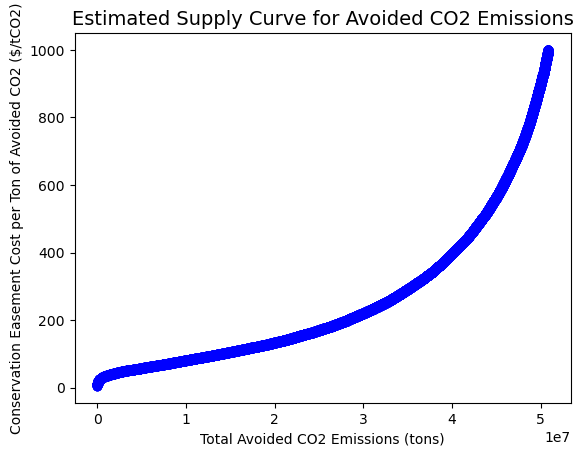

In [498]:

# Sort the parcels from low to high prices per ton of avoided carbon
sorted_dm = dm.sort_values(by='ce_cost_$/tco2')

#use cumsum()to create a new column that aggregates the tons of carbon avoided from the cheapest to the most expensive ton
sorted_dm['cum_tco2'] = sorted_dm['tco2_loss_pred_100yr'].cumsum()

# Select all parcels that offer avoided CO2 savings at less than 1,000 $/tCO2
selected_dm = sorted_dm[sorted_dm['ce_cost_$/tco2'] <= 1000]

# Plot the supply curve
fig6, ax6 = plt.subplots()
# Supply curve: x-quantity , y = price
selected_dm.plot(x='cum_tco2', y='ce_cost_$/tco2', ax=ax6, marker='o', linestyle='-' , color='b', legend=False)

# Add title and axis labels
ax6.set_title('Estimated Supply Curve for Avoided CO2 Emissions', fontsize=14)
ax6.set_xlabel('Total Avoided CO2 Emissions (tons)')
ax6.set_ylabel('Conservation Easement Cost per Ton of Avoided CO2 ($/tCO2)')

# Save the plot
#filename= '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_tco2_supply_curve.png'
#plt.savefig(filename,bbox_inches='tight', dpi=150)

# Show the plot 
plt.show()

- Find out which parcels would be reasonable for the donors to protect with conservation easements if the donors valued a ton of CO2 emissions at:
  
    1. The allowance price of the Regional Greenhouse Gas Initiative (RGGI), a cap-and-trade program that includes Massachusetts: currently $13/tCO2 (source).
       
  2. The current estimated "social cost of carbon" (SCC) under the Biden's administration's Environmental Protection Agency (EPA): $51/tCO2 (source).
     
    3. 	Uruguay's carbon tax, currently the carbon policy with the highest carbon price in the world (as of April 1, 2022): about $135/tCO2 (source).


Question 3: total expenses = full rectangle

scenario 5 is using scenario 1, then need to recompute ce_cost_$/tco2 bc the ratio is different. and then rearrange. 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


{'Scenario': 'scenario_1', 'n_parcels': 1359, 'ha_parcels': 15052.282, 'ha_loss_avoided': 5138.357566410668, 'tCO2_avoided': 2055343.026564267, 'total_cost': 69996797.45092939, 'avg_cost_per_tCO2': 34.05601719336201}


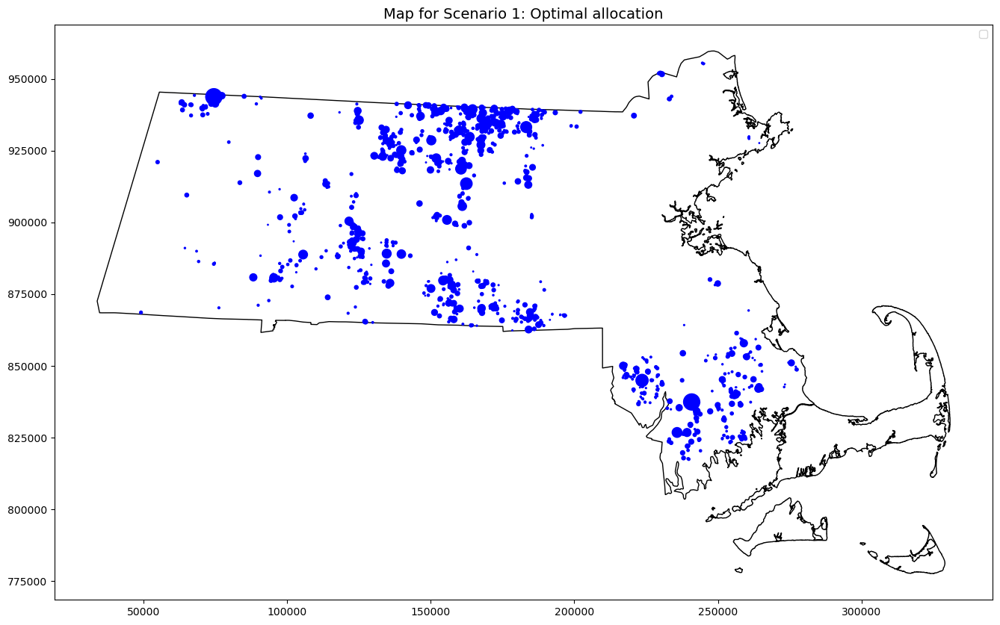

In [907]:
# Define a constant for the scenario_1 budget
BUDGET_SCENARIO_1 = 70000000
# Function to calculate the outcome variables for fixed budget for a given scenario
def calculate_outcomes_for_scenario(scenario_budget, scenario_name):
    
    # Identify parcels that can be protected within the budget
    cum_cost = dm_sorted['ce_cost_pred_usd'].cumsum()
    affordable_parcels = dm_sorted[cum_cost <= scenario_budget]
    
    # Calculate the six outcomes
    n_parcels = len(affordable_parcels)
    ha_parcels = affordable_parcels['ha'].sum()
    ha_loss_avoided = affordable_parcels['ha_f_loss_pred_100yr'].sum()
    tCO2_avoided = affordable_parcels['tco2_loss_pred_100yr'].sum()
    total_cost = affordable_parcels['ce_cost_pred_usd'].sum()
    avg_cost_per_tCO2 = total_cost / tCO2_avoided if tCO2_avoided != 0 else float('inf')
    
    # Save results in a dictionary
    results_dict = {
        'Scenario': scenario_name,
        'n_parcels': n_parcels,
        'ha_parcels': ha_parcels,
        'ha_loss_avoided': ha_loss_avoided,
        'tCO2_avoided': tCO2_avoided,
        'total_cost': total_cost,
        'avg_cost_per_tCO2': avg_cost_per_tCO2
    }
    fig1, ax1 = plt.subplots(figsize=(17, 10))
    shp_ma_outline.plot(ax=ax1, color='none', edgecolor='black')
    shp_c.join(affordable_parcels).plot(
    ax=ax1, markersize='ha', color='blue', legend=True
    )
    ax1.set_title('Map for Scenario 1: Optimal allocation', fontsize=14)
    ax1.legend()
    #filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_1.png'
    #plt.savefig(filename, bbox_inches='tight', dpi=150)
    
    return results_dict
# Calculate the outcomes for scenario 1 and create a DataFrame
scenario_1_results = calculate_outcomes_for_scenario(BUDGET_SCENARIO_1, 'scenario_1')
print(scenario_1_results)



{'Scenario': 'scenario_2', 'n_parcels': 34, 'ha_parcels': 237.61, 'ha_loss_avoided': 46.72056, 'tCO2_avoided': 18688.224000000002, 'total_cost': 68433128.33921939, 'avg_cost_per_tCO2': 3661.831554417337}


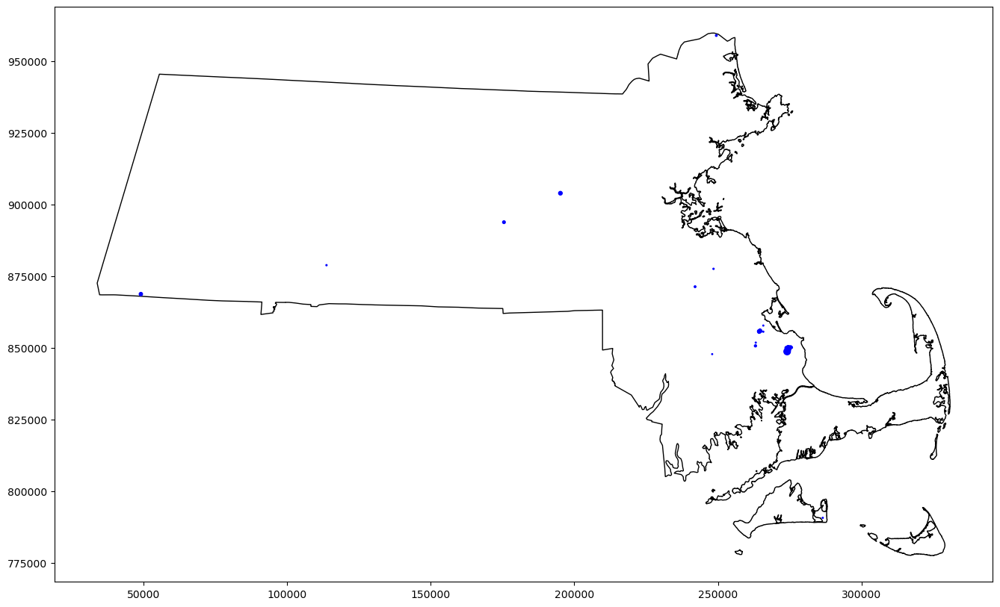

In [687]:
# Scenario 2: Panic buying. Offer payments only to the most threatened parcels until the budget is exhausted.
# Define a constant for the scenario_2 budget
BUDGET_SCENARIO_2 = 70000000
# Function to calculate the outcome variables for fixed budget for scenario 2
def calculate_outcomes_for_scenario_2(scenario_budget):
    # Filter out ineligible parcels i.e., parcels without forest cover in 2010
    eligible_parcels = dm[dm['p_f_2010'] > 0]
    
    # Sort eligible parcels by fc_pred in ascending order to identify the most threatened parcels
    eligible_sorted = eligible_parcels.sort_values('fc_pred', ascending=True)
    
    # Identify parcels that can be protected within the budget
    cum_cost = eligible_sorted['ce_cost_pred_usd'].cumsum()
    affordable_parcels = eligible_sorted[cum_cost <= scenario_budget]
    
    # Calculate the six outcomes
    n_parcels = len(affordable_parcels)
    ha_parcels = affordable_parcels['ha'].sum()
    ha_loss_avoided = affordable_parcels['ha_f_loss_pred_100yr'].sum()
    tCO2_avoided = affordable_parcels['tco2_loss_pred_100yr'].sum()
    total_cost = affordable_parcels['ce_cost_pred_usd'].sum()
    avg_cost_per_tCO2 = total_cost / tCO2_avoided if tCO2_avoided != 0 else float('inf')
    
    # Save results in a dictionary
    results_dict = {
        'Scenario': 'scenario_2',
        'n_parcels': n_parcels,
        'ha_parcels': ha_parcels,
        'ha_loss_avoided': ha_loss_avoided,
        'tCO2_avoided': tCO2_avoided,
        'total_cost': total_cost,
        'avg_cost_per_tCO2': avg_cost_per_tCO2
    }
    fig2, ax2 = plt.subplots(figsize=(17, 10))
    shp_ma_outline.plot(ax=ax2, color='none', edgecolor='black')
    shp_c.join(affordable_parcels).plot(
    ax=ax2, markersize='ha', color='blue',legend=True
    )
    ax.set_title('Map for Scenario 2: Panic buying', fontsize=14)

    filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_2.png'
    plt.savefig(filename, bbox_inches='tight', dpi=150)
    
    return results_dict
# Calculate the outcomes for scenario 2 and create a DataFrame
scenario_2_results = calculate_outcomes_for_scenario_2(BUDGET_SCENARIO_2)
scenario_2_df = pd.DataFrame([scenario_2_results])
print(scenario_2_results)

In [799]:
BUDGET_SCENARIO_3 = 70000000  # The budget for scenario 3
# Function to iteratively find the right per-hectare payment
def find_forest_flat_rate(budget, step_size=1000):
    eligible_parcels = dm[dm['p_f_2010'] > 0]
    per_hectare_price = 0
    spent_budget = 0
    
    while spent_budget < budget:
        per_hectare_price += step_size
        eligible_parcels['offered_payment'] = (per_hectare_price * eligible_parcels['ha']) / 100
        participating_parcels = eligible_parcels[eligible_parcels['offered_payment'] > eligible_parcels['ce_cost_pred_usd']]
        spent_budget = participating_parcels['offered_payment'].sum()
    
    # If we went over budget, take one step back
    if spent_budget > budget:
        per_hectare_price -= step_size
        participating_parcels = eligible_parcels[eligible_parcels['offered_payment'] > eligible_parcels['ce_cost_pred_usd']]
        spent_budget = participating_parcels['offered_payment'].sum()
    
    # Narrowing down using smaller steps to reach a multiple of $10 just under budget
    step_size = 10
    while spent_budget < budget:
        per_hectare_price += step_size
        eligible_parcels['offered_payment'] = (per_hectare_price * eligible_parcels['ha']) / 100
        participating_parcels = eligible_parcels[eligible_parcels['offered_payment'] > eligible_parcels['ce_cost_pred_usd']]
        spent_budget = participating_parcels['offered_payment'].sum()
    
    # Finally, if we went over budget again, take one small step back
    if spent_budget > budget:
        per_hectare_price -= step_size
    
    # Compute results for the final per-hectare price
    eligible_parcels['offered_payment'] = (per_hectare_price * eligible_parcels['ha']) / 100
    participating_parcels = eligible_parcels[eligible_parcels['offered_payment'] > eligible_parcels['ce_cost_pred_usd']]
    spent_budget = participating_parcels['offered_payment'].sum()
    
    return per_hectare_price, participating_parcels
# Finding the right per-hectare price for scenario 3 and obtaining the participating parcels
per_hectare_price_scenario_3, parcels_scenario_3 = find_forest_flat_rate(BUDGET_SCENARIO_3)
# Using the parcels to calculate the outcomes
scenario_3_results = {
    'Scenario': 'scenario_3',
    'per_hectare_price': per_hectare_price_scenario_3,
    'total_cost': parcels_scenario_3['offered_payment'].sum(),
    'n_parcels': parcels_scenario_3.shape[0],
    'hapurchased': parcels_scenario_3['ha'].sum(), 
    'tco2saved': parcels_scenario_3['tco2_loss_pred_100yr'].sum(),
    'avg': parcels_scenario_3['offered_payment'].sum() / parcels_scenario_3['tco2_loss_pred_100yr'].sum()
}
print(scenario_3_results)


/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_35009/1380473982.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eligible_parcels['offered_payment'] = (per_hectare_price * eligible_parcels['ha']) / 100


{'Scenario': 'scenario_3', 'per_hectare_price': 259990, 'total_cost': 69285837.4576, 'n_parcels': 1360, 'hapurchased': 26649.424, 'tco2saved': 414158.71794378385, 'avg': 167.29295908967094}


/var/folders/ys/3475k00n0gl_64cf8s8c35dc0000gn/T/ipykernel_35009/1380473982.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eligible_parcels['offered_payment'] = (per_hectare_price * eligible_parcels['ha']) / 100


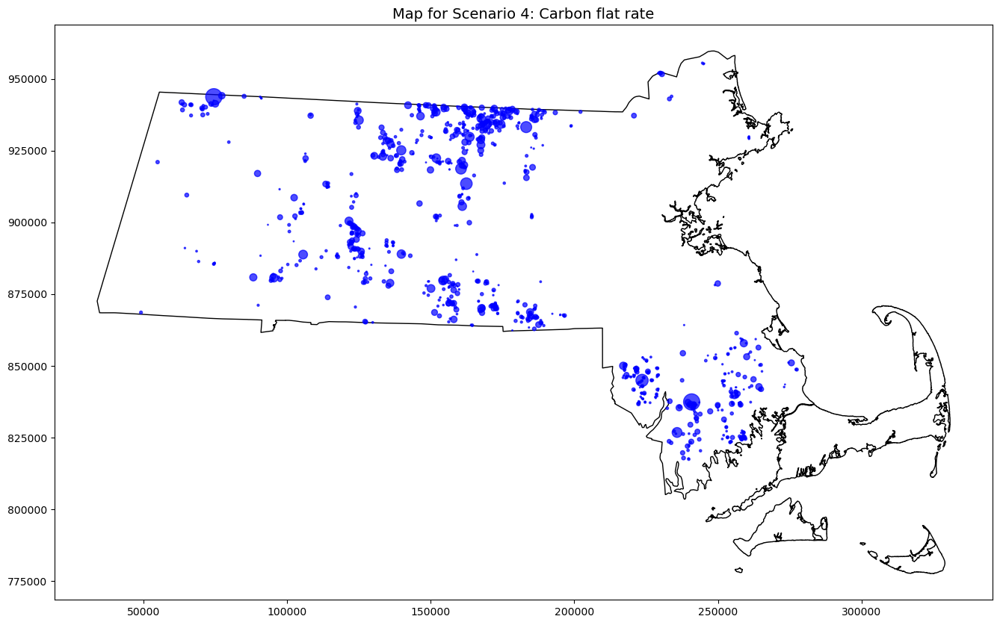

{'Scenario': 'scenario_4', 'payment_per_tCO2': 41, 'total_cost': 68816151.18245605, 'n_parcels': 1108, 'ha_purchased': 12051.588, 'tCO2_saved': 1678442.7117672206, 'ha_loss_avoided': 4196.106779418052}


In [980]:
# Define a constant for the scenario_4 budget
BUDGET_SCENARIO_4 = 70000000  # Replace with the actual budget for Scenario 4

def calculate_outcomes_for_scenario_4(budget):
    payment_per_tCO2 = 0  # Initialize payment per ton of CO2
    total_cost = 0

    while total_cost < budget:
        payment_per_tCO2 += 1  # Increment payment by 1 to find the highest integer value
        # Calculate the payment for each parcel based on the payment per ton of CO2
        dm['offered_payment'] = dm['tco2_loss_pred_100yr'] * payment_per_tCO2
        # Identify parcels where owners would participate
        participated_parcels = dm[dm['offered_payment'] >= dm['ce_cost_pred_usd']]
        total_cost = participated_parcels['offered_payment'].sum()
        
        # If the total cost exceeds the budget, reduce the payment by 1 to stay under budget
        if total_cost > budget:
            payment_per_tCO2 -= 1
            # Re-calculate with the reduced payment
            dm['offered_payment'] = dm['tco2_loss_pred_100yr'] * payment_per_tCO2
            participated_parcels = dm[dm['offered_payment'] >= dm['ce_cost_pred_usd']]
            total_cost = participated_parcels['offered_payment'].sum()
            break

    # Save the results in a dictionary
    scenario_results = {
        'Scenario': 'scenario_4',
        'payment_per_tCO2': payment_per_tCO2,
        'total_cost': total_cost,
        'n_parcels': participated_parcels.shape[0],
        'ha_purchased': participated_parcels['ha'].sum(),
        'tCO2_saved': participated_parcels['tco2_loss_pred_100yr'].sum(),
        'ha_loss_avoided': participated_parcels['ha_f_loss_pred_100yr'].sum()
        
    }
    # Create the map
    fig, ax = plt.subplots(figsize=(17, 10))
    shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
    shp_c.join(participated_parcels).plot(ax=ax, markersize='ha', color='blue', alpha=0.7, legend=True)
    ax.set_title('Map for Scenario 4: Carbon flat rate', fontsize=14)

    #filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_4.png'
    #plt.savefig(filename, bbox_inches='tight', dpi=150)
    plt.show()


    return scenario_results

scenario_4_results = calculate_outcomes_for_scenario_4(BUDGET_SCENARIO_4)
print(scenario_4_results)


{'n': 1389, 'ha_pc': 26511.665, 'ha_loss_avo': 986.1079972638549, 'tco2_avo': 394443.19890554197, 'budget_used': 69993398.664, 'avg_usd_tco2': 177.44861328122798}


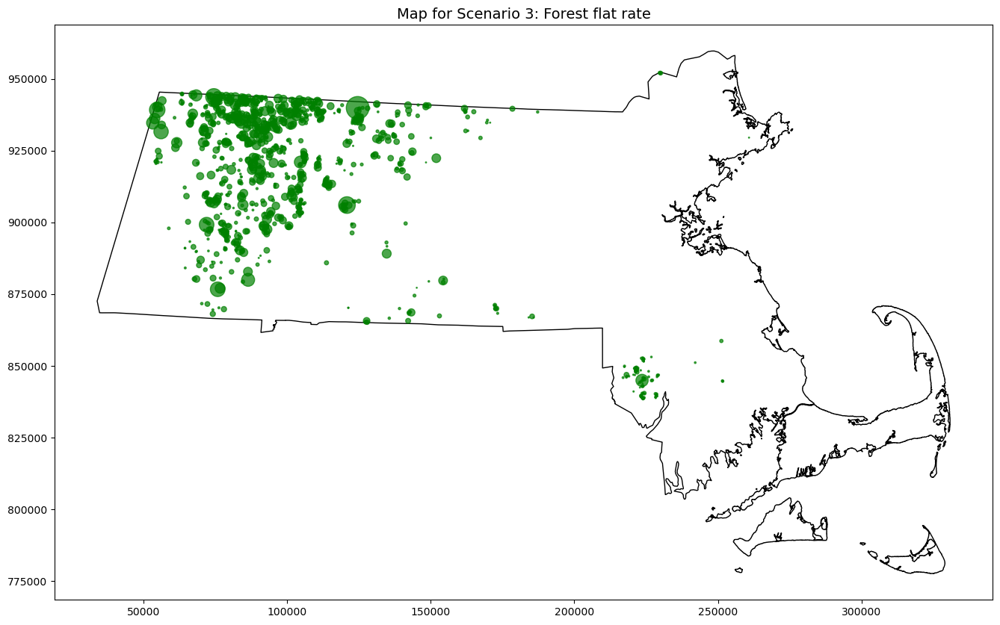

In [878]:
# Function to calculate outcomes for scenario 3
def calculate_outcomes_scenario_3(budget):
    dm['forest_area_2010'] = dm['ha'] * (dm['p_f_2010'] / 100)
    dm['cost_at_payment'] = 2680 * dm['forest_area_2010']

    # Select parcels where cost_at_payment is higher than the easement cost and within the budget
    selected_parcels = dm[(dm['cost_at_payment'] >= dm['ce_cost_pred_usd']) & (dm['cost_at_payment'] <= budget)]

    # Outcome variables
    n = selected_parcels.shape[0]  # Count of parcels
    ha_pc = selected_parcels['ha'].sum()  # Total area of selected parcels
    ha_loss_avo = selected_parcels['ha_f_loss_pred_100yr'].sum()  # Total area loss avoided
    tco2_avo = selected_parcels['tco2_loss_pred_100yr'].sum()  # Total CO2 saved
    budget_used = selected_parcels['cost_at_payment'].sum()  # Total cost used at cost_at_payment
    avg_usd_tco2 = budget_used / tco2_avo if tco2_avo else 0  # Average cost per tCO2 saved

    return {
        'n': n,
        'ha_pc': ha_pc,
        'ha_loss_avo': ha_loss_avo,
        'tco2_avo': tco2_avo,
        'budget_used': budget_used,
        'avg_usd_tco2': avg_usd_tco2
    }

# Budget for scenario 3
BUDGET_SCENARIO_3 = 70000000  # Placeholder value, adjust as per actual budget
scen3 = calculate_outcomes_scenario_3(BUDGET_SCENARIO_3)
print(scen3)
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_c.join(selected_parcels).plot(ax=ax, markersize='ha', color='green', alpha=0.7, legend=True)
ax.set_title('Map for Scenario 3: Forest flat rate', fontsize=14)

filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_3.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()

{'Scenario': 'Scenario_5', 'n': 265, 'ha_pc': 11380.918000000001, 'ha_loss_avo': 3867.0915115151156, 'tco2_avo': 1546836.6046060466, 'budget': 69923812.15111563, 'avg_usd_tco2': 45.20439453197712}


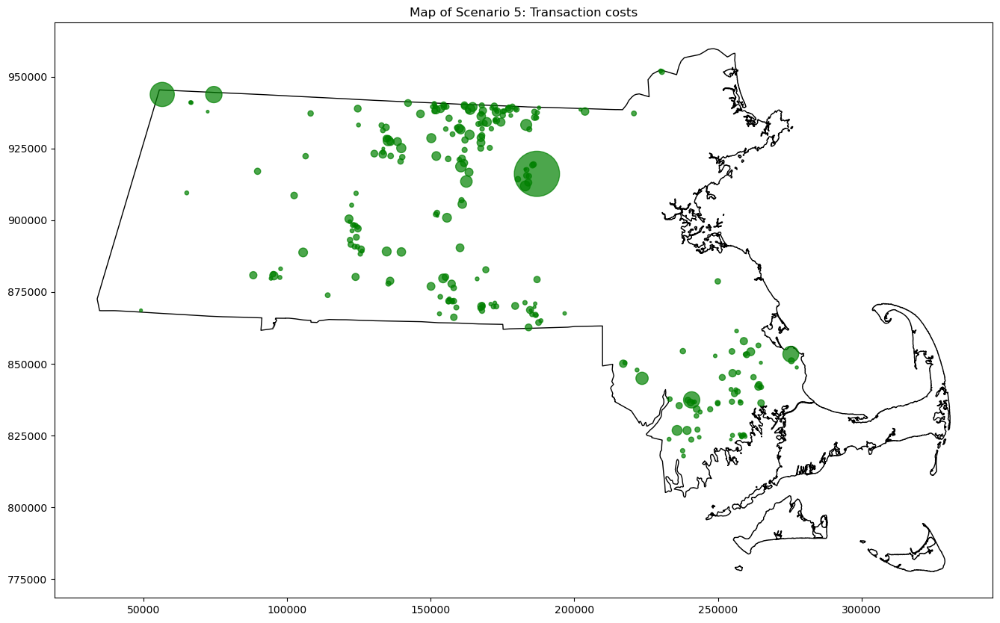

In [956]:
# Scenario 5: Transaction costs

# Initialize a fixed budget and transaction cost per parcel
BUDGET = 70000000 # You'll need to adjust this number based on the budget in your context
TRANSACTION_COST_PER_PARCEL = 45000

# Calculate the total cost including transaction cost for each parcel
dm['total_cost_with_tc'] = dm['ce_cost_pred_usd'] + TRANSACTION_COST_PER_PARCEL
dm['total_cost_with_tc_$'] = dm['total_cost_with_tc'] / dm['tco2_loss_pred_100yr']

# Sort parcels by the total cost per ton of CO2 emissions
dm_sorted = dm.sort_values('total_cost_with_tc_$')
dm_sorted['total_cost_with_tc_usd_cumsum'] = dm_sorted['total_cost_with_tc'].cumsum()

# Identify parcels within budget based on the total cost including transaction costs
dm_sorted['selected'] = dm_sorted['total_cost_with_tc_usd_cumsum'] <= BUDGET

# Calculate outcome indicators
selected_parcels = dm_sorted[dm_sorted['selected']]
n = selected_parcels.shape[0]
ha_pc = selected_parcels['ha'].sum()
ha_loss_avo = selected_parcels['ha_f_loss_pred_100yr'].sum()
tco2_avo = selected_parcels['tco2_loss_pred_100yr'].sum()
budget_used = selected_parcels['total_cost_with_tc'].sum()
avg_usd_tco2 = budget_used / tco2_avo if tco2_avo else 0

# Append the outcome indicators specific for Scenario 5
scenario_results = {
    'Scenario': 'Scenario_5',
    'n': n,
    'ha_pc': ha_pc,
    'ha_loss_avo': ha_loss_avo,
    'tco2_avo': tco2_avo,
    'budget': budget_used,
    'avg_usd_tco2': avg_usd_tco2
}
print(scenario_results)
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_c.join(selected_parcels).plot(ax=ax, markersize='ha', color='green', alpha=0.7, legend=True)
ax.set_title("Map of Scenario 5: Transaction costs")
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_5.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()

In [979]:
# Scenario 6: Prediction errors

# Define the budget
BUDGET = 70000000  # Adjust this number to your specific budget

# Add random noise to `ls_pred` with a mean increase of 0.1 and a standard deviation of 0.25
random_noise = np.random.normal(0.1, 0.25, size=len(dm))
dm['ls_pred_wta'] = dm['ls_pred'] + random_noise

# Convert the WTA log sale prices back to USD
dm['acq_cost_wta_usd'] = np.exp(dm['ls_pred_wta']) * dm['ha']
dm['ce_cost_wta_usd'] = dm['acq_cost_wta_usd'] * 0.4  # Assuming 40% is the easement cost rate

# Sort parcels by 'ce_cost_$/tco2'
dm_sorted = dm.sort_values('ce_cost_$/tco2')

# Initialize a list to keep track of parcels where offers are accepted and budget accumulates
selected_parcels = []
current_budget = BUDGET

# Make offers to landowners until the budget is exhausted
for idx, row in dm_sorted.iterrows():
    offer = row['ce_cost_wta_usd']
    if offer <= current_budget:
        selected_parcels.append(row)
        current_budget -= offer

# Dataframe of accepted offers
selected_df = pd.DataFrame(selected_parcels)

# Calculate outcome indicators
n = selected_df.shape[0]
ha_pc = selected_df['ha'].sum()
ha_loss_avo = selected_df['ha_f_loss_pred_100yr'].sum()
tco2_avo = selected_df['tco2_loss_pred_100yr'].sum()
budget_used = BUDGET - current_budget
avg_usd_tco2 = budget_used / tco2_avo if tco2_avo != 0 else np.inf

# Outcome data for the scenario
scenario_6_data = {
    'Scenario': '6_Prediction_Errors',
    'n': n,
    'ha_pc': ha_pc,
    'ha_loss_avo': ha_loss_avo,
    'tco2_avo': tco2_avo,
    'budget': budget_used,
    'avg_usd_tco2': avg_usd_tco2
}

print(scenario_6_data)


{'Scenario': '6_Prediction_Errors', 'n': 1209, 'ha_pc': 13380.67, 'ha_loss_avo': 4619.058460015447, 'tco2_avo': 1847623.3840061785, 'budget': 69999541.72546011, 'avg_usd_tco2': 37.886260983383416}


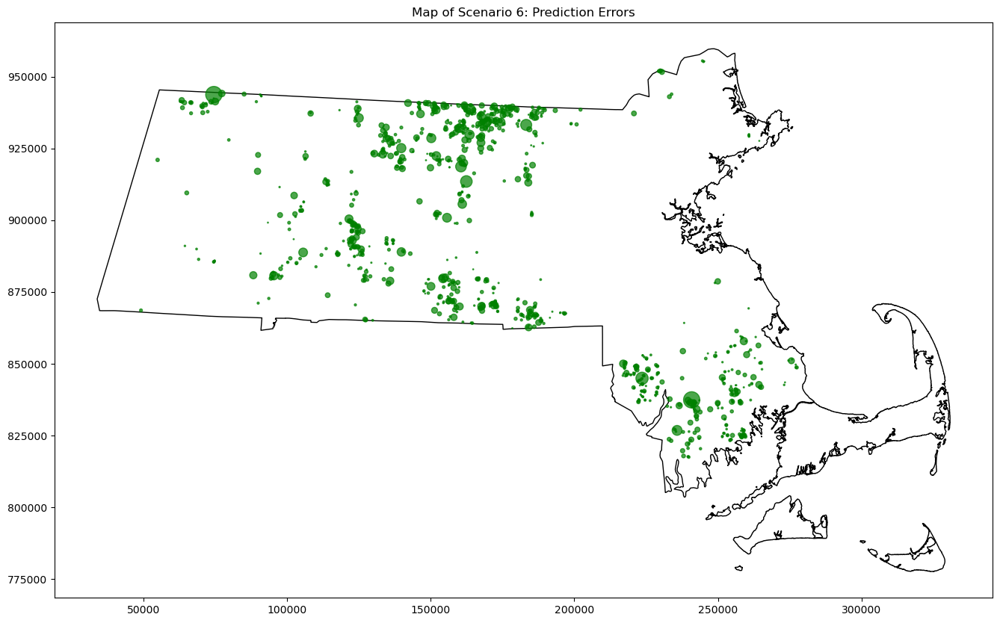

In [971]:
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_c.join(selected_df).plot(ax=ax, markersize='ha', color='green', alpha=0.7, legend=True)
ax.set_title("Map of Scenario 6: Prediction Errors")
filename = '/Volumes/Class_Folders/ee_508/Students/cecilyw/Deliverables/L3/2_selected_parcels_scenario_6.png'
plt.savefig(filename, bbox_inches='tight', dpi=150)
plt.show()